In [1]:
!pip install optuna
!pip install pytorch-lightning
!pip install pytorch-forecasting

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 308 kB 12.7 MB/s 
     |████████████████████████████████| 209 kB 39.9 MB/s 
     |████████████████████████████████| 81 kB 9.8 MB/s 
     |████████████████████████████████| 78 kB 7.3 MB/s 
     |████████████████████████████████| 146 kB 68.1 MB/s 
     |████████████████████████████████| 49 kB 6.7 MB/s 
     |████████████████████████████████| 112 kB 60.2 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=26cee73ecf50ec4251dead4e0074218f32856b228dc489d748d437099f2960b1
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 585 kB 12.3 MB/s 
     |████████████████████████████████| 419 kB 66.2 

In [2]:
import os
import warnings
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import optuna

from typing import Any, Callable, Dict, List, Optional, Tuple, Union
from sklearn.preprocessing import MinMaxScaler


import torch
import torch.nn.functional as F
from torch import distributions

import pytorch_lightning as pl
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_forecasting.data.examples import generate_ar_data

from pytorch_forecasting import Baseline, DeepAR, TimeSeriesDataSet
from pytorch_forecasting.data import NaNLabelEncoder
from pytorch_forecasting.metrics import SMAPE, DistributionLoss, NormalDistributionLoss, LogNormalDistributionLoss, BaseEstimator
from pytorch_forecasting.data.encoders import GroupNormalizer

import tensorflow as tf 
import tensorboard as tb 
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

warnings.filterwarnings('ignore')
%matplotlib inline

logger = TensorBoardLogger('.', name = 'DeepAR')

from datetime import datetime

save_path = '/content/drive/MyDrive/Colab Notebooks/실무인증/Data/'
datetime.today()
today = datetime.today()
str_today = today.strftime('%y%m%d%H%M')
save_model = save_path + str_today + '_DeepAR_step_saved_model.pth'
save_model

/usr/local/lib/python3.7/dist-packages/torchmetrics/utilities/prints.py:36: UserWarning: Torchmetrics v0.9 introduced a new argument class property called `full_state_update` that has
                not been set for this class (SMAPE). The property determines if `update` by
                default needs access to the full metric state. If this is not the case, significant speedups can be
                achieved and we recommend setting this to `False`.
                We provide an checking function
                `from torchmetrics.utilities import check_forward_no_full_state`
                that can be used to check if the `full_state_update=True` (old and potential slower behaviour,
                default for now) or if `full_state_update=False` can be used safely.
                
  warnings.warn(*args, **kwargs)


'/content/drive/MyDrive/Colab Notebooks/실무인증/Data/2206200355_DeepAR_step_saved_model.pth'

In [3]:
class MultivariateDistributionLoss(DistributionLoss):
    """Base class for multivariate distribution losses.

    Class should be inherited for all multivariate distribution losses, i.e. if a batch of values
    is predicted in one go and the batch dimension is not independent, but the time dimension still
    remains independent.
    """

    def sample(self, y_pred, n_samples: int) -> torch.Tensor:
        """
        Sample from distribution.

        Args:
            y_pred: prediction output of network (shape batch_size x n_timesteps x n_paramters)
            n_samples (int): number of samples to draw

        Returns:
            torch.Tensor: tensor with samples  (shape batch_size x n_timesteps x n_samples)
        """
        dist = self.map_x_to_distribution(y_pred)
        samples = dist.sample((n_samples,)).permute(
            2, 1, 0
        )  # returned as (n_samples, n_timesteps, batch_size), so reshape to (batch_size, n_timesteps, n_samples)
        return samples


    def to_prediction(self, y_pred: torch.Tensor) -> torch.Tensor:
        """
        Convert network prediction into a point prediction.

        Args:
            y_pred: prediction output of network

        Returns:
            torch.Tensor: mean prediction
        """
        distribution = self.map_x_to_distribution(y_pred)

        return distribution.mean.transpose(0, 1)  # switch to batch_size x n_timesteps


    def loss(self, y_pred: torch.Tensor, y_actual: torch.Tensor) -> torch.Tensor:
        """
        Calculate negative likelihood

        Args:
            y_pred: network output
            y_actual: actual values

        Returns:
            torch.Tensor: metric value on which backpropagation can be applied
        """
        distribution = self.map_x_to_distribution(y_pred)
        # calculate one number and scale with batch size
        loss = -distribution.log_prob(y_actual.transpose(0, 1)).sum() * y_actual.size(0)
        return loss

In [4]:
class MultivariateNormalDistributionLoss(MultivariateDistributionLoss):
    """
    Multivariate low-rank normal distribution loss.

    Use this loss to make out of a DeepAR model a DeepVAR network.

    Requirements for original target normalizer:
        * not normalized in log space (use :py:class:`~LogNormalDistributionLoss`)
        * not coerced to be positive
    """

    distribution_class = distributions.LowRankMultivariateNormal

    def __init__(
        self,
        name: str = None,
        quantiles: List[float] = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98],
        reduction: str = "mean",
        rank: int = 10,
        sigma_init: float = 1.0,
        sigma_minimum: float = 1e-3,
    ):
        """
        Initialize metric

        Args:
            name (str): metric name. Defaults to class name.
            quantiles (List[float], optional): quantiles for probability range.
                Defaults to [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98].
            reduction (str, optional): Reduction, "none", "mean" or "sqrt-mean". Defaults to "mean".
            rank (int): rank of low-rank approximation for covariance matrix. Defaults to 10.
            sigma_init (float, optional): default value for diagonal covariance. Defaults to 1.0.
            sigma_minimum (float, optional): minimum value for diagonal covariance. Defaults to 1e-3.
        """
        super().__init__(name=name, quantiles=quantiles, reduction=reduction)
        self.rank = rank
        self.sigma_minimum = sigma_minimum
        self.sigma_init = sigma_init
        self.distribution_arguments = list(range(2 + rank))

        # determine bias
        self._diag_bias: float = self.inv_softplus(self.sigma_init**2) if self.sigma_init > 0.0 else 0.0

    def map_x_to_distribution(self, x: torch.Tensor) -> distributions.Normal:
        x = x.permute(1, 0, 2)
        return self.distribution_class(
            loc=x[..., 0],
            cov_factor=x[..., 2:],
            cov_diag=x[..., 1],
        )


    @staticmethod
    def validate_encoder(encoder: BaseEstimator):
        assert encoder.transformation not in [
            "log",
            "log1p",
        ], "Use MultivariateLogNormalDistributionLoss for log scaled data"  # todo: implement
        assert encoder.transformation not in [
            "softplus",
            "relu",
        ], "Cannot use NormalDistributionLoss for positive data"
        assert encoder.transformation not in ["logit"], "Cannot use bound transformation such as 'logit'"

    def rescale_parameters(
        self, parameters: torch.Tensor, target_scale: torch.Tensor, encoder: BaseEstimator
    ) -> torch.Tensor:
#         self.validate_encoder(encoder)

        # scale
        loc = encoder(dict(prediction=parameters[..., 0], target_scale=target_scale)).unsqueeze(-1)
        scale = (
            F.softplus(parameters[..., 1].unsqueeze(-1) + self._diag_bias) + self.sigma_minimum**2
        ) * target_scale[..., 1, None, None] ** 2

        cov_factor = parameters[..., 2:] * target_scale[..., 1, None, None]
        return torch.concat([loc, scale, cov_factor], dim=-1)


    def inv_softplus(self, y):
        if y < 20.0:
            return np.log(np.exp(y) - 1.0)
        else:
            return y

In [5]:
with open('/content/drive/MyDrive/Colab Notebooks/실무인증/Data/crypto_currency_data_step_v2.pickle', 'rb') as f:
    data = pickle.load(f)

# drop_col = ['keyword']
# data_t = data.drop(drop_col, axis=1)
# data['keyword'] = data['keyword'].str.replace("<"," ")
data_t = data.copy()
data_t['date'] = pd.to_datetime(data_t['date'], format='%Y-%m-%d')
data_t = data_t.sort_values('date').reset_index(drop=True)
data_t['time_index'] = np.arange(len(data))
data_t['time_index'] = data_t['time_index'].astype(int)
data_t['dominant_topic'] = data_t['dominant_topic'].astype(str).astype("category")

target_col = ['trade_price']
ord_col = data_t.dtypes.index[(data_t.dtypes.values != 'float64')].tolist()
scale_col = data_t.columns[~data_t.columns.isin(ord_col) & ~data_t.columns.isin(target_col)].tolist()

# MinMaxScaler
scaler = MinMaxScaler(feature_range = (0,1))
scaler_t = MinMaxScaler(feature_range = (0,1))

data_feature_scaled = scaler.fit_transform(data_t[scale_col])
data_target_scaled = scaler_t.fit_transform(data_t[target_col])


data_f_scaled = pd.DataFrame(data_feature_scaled, columns=scale_col)
data_t_scaled = pd.DataFrame(data_target_scaled, columns=target_col)
res_data = pd.concat([data_f_scaled, data_t[ord_col], data_t_scaled], axis=1)


# Variable set
max_encoder_length = 90    # encoder LSTM에 들어가는 길이
max_prediction_length = 20 # decoder의 길이



# # GroupNormalizer
# gn = GroupNormalizer(
#     groups= ['market'],
#     scale_by_group = True,
#     transformation="softplus"
# )

# res_data_columns = res_data.drop(columns=['date','market', 'time_index', 'kr_holiday','us_holiday','dayofweek','month','dominant_topic'], axis=1).columns
# for n, i in enumerate(res_data_columns):
#     # if n < 3:
#     # print(i)
#     globals()['scaled_{}'.format(i)] = gn.fit_transform(res_data[i], res_data, return_norm = True)
#     res_data[i] = globals()['scaled_{}'.format(i)][0]


In [6]:
res_data.isna().sum()

change_price          0
prev_closing_price    0
cmdt_cc               0
fx_gbpusd             0
date                  0
market                0
kr_holiday            0
us_holiday            0
dayofweek             0
month                 0
dominant_topic        0
time_index            0
trade_price           0
dtype: int64

In [7]:
res_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1707 entries, 0 to 1706
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   change_price        1707 non-null   float64       
 1   prev_closing_price  1707 non-null   float64       
 2   cmdt_cc             1707 non-null   float64       
 3   fx_gbpusd           1707 non-null   float64       
 4   date                1707 non-null   datetime64[ns]
 5   market              1707 non-null   object        
 6   kr_holiday          1707 non-null   object        
 7   us_holiday          1707 non-null   object        
 8   dayofweek           1707 non-null   category      
 9   month               1707 non-null   category      
 10  dominant_topic      1707 non-null   category      
 11  time_index          1707 non-null   int64         
 12  trade_price         1707 non-null   float64       
dtypes: category(3), datetime64[ns](1), float64(5), i

In [8]:
def objective(trial):

    cfg = { 'learning_rate' : trial.suggest_loguniform('learning_rate', 1e-4, 1e-0),
            'hidden_size' : trial.suggest_categorical('hidden_size', [16,32,64,128,256]),
            'gradient_clip_val' : trial.suggest_loguniform('gradient_clip_val', 1e-4, 1e-0),
            'rnn_layers' : trial.suggest_int('rnn_layers', 2, 6)
            } 

    torch.manual_seed(42)

    # create dataset and dataloader
    log_interval = 10
    log_val_interval = 1
    limit_train_batches = 50
    batch_size = 128
    gpus = 1
    max_epochs = 150

    training_cutoff = int(res_data['time_index'].max() * .7)


    training = TimeSeriesDataSet(
        res_data[lambda x: x.time_index <= training_cutoff],
        time_idx="time_index",
        target="trade_price",
        categorical_encoders={"market": NaNLabelEncoder().fit(res_data.market)},
        group_ids=["market"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_unknown_reals= ["trade_price"],
        time_varying_known_reals=["time_index","dayofweek","month"], 
        static_categoricals=["market"],
        add_relative_time_idx=False,
        add_target_scales=True,
        randomize_length=(0.2, 0.05),
    )

    validation = TimeSeriesDataSet.from_dataset(
        training,
        res_data,
        min_prediction_idx = training_cutoff + 1,
        # stop_randomization=True
    )

    train_dataloader = training.to_dataloader(train = True, batch_size = batch_size, num_workers = 0)
    val_dataloader = validation.to_dataloader(train = False, batch_size = batch_size, num_workers = 0)

    # calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
    actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
    baseline_predictions = Baseline().predict(val_dataloader)
    mae_with_baseline = (actuals - baseline_predictions).abs().mean().item()
    print(f'mae_with_baseline : {mae_with_baseline}')
    print(f'Baseline SMAPE : {SMAPE()(baseline_predictions, actuals)}')


    net = DeepAR.from_dataset(
        training, 
        learning_rate = cfg['learning_rate'],
        log_interval = log_interval,
        log_val_interval = log_val_interval,
        hidden_size = cfg['hidden_size'],
        rnn_layers = cfg['rnn_layers'],
        loss = MultivariateNormalDistributionLoss(rank=30)
    )


    early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=True, mode="min")
    lr_logger = LearningRateMonitor()

    trainer = pl.Trainer(
        max_epochs = max_epochs,
        gpus = gpus,
        weights_summary = 'top',
        gradient_clip_val = cfg['gradient_clip_val'],
        callbacks = [lr_logger, early_stop_callback],
        limit_train_batches =  limit_train_batches,
        enable_checkpointing = True,
        auto_lr_find = True,
        logger = logger
    )



    print(f"Number of parameters in network: {net.size()/1e3:.1f}k")

    trainer.fit(
        net,
        train_dataloaders = train_dataloader,
        val_dataloaders = val_dataloader,
    )

    best_model_path = trainer.checkpoint_callback.best_model_path
    best_model = DeepAR.load_from_checkpoint(best_model_path)
    torch.save(best_model.state_dict(), save_model)

    actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
    predictions, _ = best_model.predict(val_dataloader, return_x=True, n_samples=100)

    return SMAPE()(predictions, actuals)

In [ ]:
# # save datasets
# training.save("training.pkl")
# validation.save("validation.pkl")

In [9]:
sampler = optuna.samplers.TPESampler()

study = optuna.create_study(sampler=sampler, direction='minimize') 
study.optimize(objective, n_trials=25)

[I 2022-06-20 03:55:56,309] A new study created in memory with name: no-name-b94aa041-6f6e-4ed0-b530-044242b3c4d3
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: ./DeepAR


mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 87.3k


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 85.2 K
4 | distribution_projector | Linear                             | 2.1 K 
------------------------------------------------------------------------------
87.3 K    Trainable params
0         Non-trainable params
87.3 K    Total params
0.349     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -112.184


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 126.138 >= min_delta = 0.0001. New best score: -238.321


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.330 >= min_delta = 0.0001. New best score: -242.651


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.595 >= min_delta = 0.0001. New best score: -257.246


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.750 >= min_delta = 0.0001. New best score: -258.996


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -258.996. Signaling Trainer to stop.
[I 2022-06-20 03:57:31,439] Trial 0 finished with value: 0.6195235848426819 and parameters: {'learning_rate': 0.6240317279972685, 'hidden_size': 64, 'gradient_clip_val': 0.10734724879280215, 'rnn_layers': 3}. Best is trial 0 with value: 0.6195235848426819.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 3.8

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 4.3k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -77.838


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.284 >= min_delta = 0.0001. New best score: -81.122


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.173 >= min_delta = 0.0001. New best score: -83.295


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.734 >= min_delta = 0.0001. New best score: -89.029


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.955 >= min_delta = 0.0001. New best score: -95.985


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.410 >= min_delta = 0.0001. New best score: -99.394


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.337 >= min_delta = 0.0001. New best score: -107.731


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.538 >= min_delta = 0.0001. New best score: -116.269


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.556 >= min_delta = 0.0001. New best score: -119.825


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.093 >= min_delta = 0.0001. New best score: -127.918


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.116 >= min_delta = 0.0001. New best score: -135.034


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.550 >= min_delta = 0.0001. New best score: -137.583


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.526 >= min_delta = 0.0001. New best score: -143.109


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.470 >= min_delta = 0.0001. New best score: -147.579


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.571 >= min_delta = 0.0001. New best score: -149.151


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.332 >= min_delta = 0.0001. New best score: -152.483


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.825 >= min_delta = 0.0001. New best score: -155.308


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.083 >= min_delta = 0.0001. New best score: -156.391


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.514 >= min_delta = 0.0001. New best score: -158.905


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.347 >= min_delta = 0.0001. New best score: -161.251


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.869 >= min_delta = 0.0001. New best score: -162.121


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.133 >= min_delta = 0.0001. New best score: -164.254


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.096 >= min_delta = 0.0001. New best score: -166.350


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.843 >= min_delta = 0.0001. New best score: -167.193


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.164 >= min_delta = 0.0001. New best score: -169.357


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.328 >= min_delta = 0.0001. New best score: -171.685


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.991 >= min_delta = 0.0001. New best score: -172.676


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.687 >= min_delta = 0.0001. New best score: -175.364


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.022 >= min_delta = 0.0001. New best score: -178.385


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.358 >= min_delta = 0.0001. New best score: -179.743


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.646 >= min_delta = 0.0001. New best score: -183.390


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.037 >= min_delta = 0.0001. New best score: -187.427


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.819 >= min_delta = 0.0001. New best score: -189.246


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.714 >= min_delta = 0.0001. New best score: -193.960


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.007 >= min_delta = 0.0001. New best score: -198.966


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.098 >= min_delta = 0.0001. New best score: -201.064


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.193 >= min_delta = 0.0001. New best score: -206.257


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.989 >= min_delta = 0.0001. New best score: -211.245


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.975 >= min_delta = 0.0001. New best score: -213.221


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.786 >= min_delta = 0.0001. New best score: -218.007


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.687 >= min_delta = 0.0001. New best score: -222.694


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.764 >= min_delta = 0.0001. New best score: -224.458


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.792 >= min_delta = 0.0001. New best score: -228.250


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.319 >= min_delta = 0.0001. New best score: -231.569


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.071 >= min_delta = 0.0001. New best score: -232.640


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.845 >= min_delta = 0.0001. New best score: -235.485


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.210 >= min_delta = 0.0001. New best score: -238.695


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.904 >= min_delta = 0.0001. New best score: -239.599


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.705 >= min_delta = 0.0001. New best score: -242.304


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.102 >= min_delta = 0.0001. New best score: -244.405


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.983 >= min_delta = 0.0001. New best score: -245.388


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.099 >= min_delta = 0.0001. New best score: -247.487


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.478 >= min_delta = 0.0001. New best score: -247.966


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.608 >= min_delta = 0.0001. New best score: -248.574


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.119 >= min_delta = 0.0001. New best score: -249.693


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.889 >= min_delta = 0.0001. New best score: -251.581


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.132 >= min_delta = 0.0001. New best score: -251.713


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.218 >= min_delta = 0.0001. New best score: -252.931


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.035 >= min_delta = 0.0001. New best score: -253.966


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.116 >= min_delta = 0.0001. New best score: -254.082


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.597 >= min_delta = 0.0001. New best score: -254.679


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.849 >= min_delta = 0.0001. New best score: -255.528


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.437 >= min_delta = 0.0001. New best score: -255.965


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.190 >= min_delta = 0.0001. New best score: -257.154


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.360 >= min_delta = 0.0001. New best score: -257.514


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.355 >= min_delta = 0.0001. New best score: -257.870


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 0.0001. New best score: -257.883


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.102 >= min_delta = 0.0001. New best score: -257.985


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.136 >= min_delta = 0.0001. New best score: -258.120


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.087 >= min_delta = 0.0001. New best score: -258.207


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.037 >= min_delta = 0.0001. New best score: -258.244


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.049 >= min_delta = 0.0001. New best score: -258.293


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.036 >= min_delta = 0.0001. New best score: -258.330


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.037 >= min_delta = 0.0001. New best score: -258.366


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.074 >= min_delta = 0.0001. New best score: -258.441


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.306 >= min_delta = 0.0001. New best score: -258.747


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -258.747. Signaling Trainer to stop.
[I 2022-06-20 04:05:04,519] Trial 1 finished with value: 0.3499011695384979 and parameters: {'learning_rate': 0.0024480568517614722, 'hidden_size': 16, 'gradient_clip_val': 0.04670848989885008, 'rnn_layers': 2}. Best is trial 1 with value: 0.3499011695384979.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 602.7k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -26.126


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.191 >= min_delta = 0.0001. New best score: -26.317


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.123 >= min_delta = 0.0001. New best score: -26.440


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.317 >= min_delta = 0.0001. New best score: -26.757


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.404 >= min_delta = 0.0001. New best score: -27.160


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.196 >= min_delta = 0.0001. New best score: -27.356


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.501 >= min_delta = 0.0001. New best score: -27.857


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.577 >= min_delta = 0.0001. New best score: -28.434


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.261 >= min_delta = 0.0001. New best score: -28.695


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.684 >= min_delta = 0.0001. New best score: -29.379


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.734 >= min_delta = 0.0001. New best score: -30.112


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.316 >= min_delta = 0.0001. New best score: -30.428


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.855 >= min_delta = 0.0001. New best score: -31.283


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.953 >= min_delta = 0.0001. New best score: -32.236


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.428 >= min_delta = 0.0001. New best score: -32.664


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.167 >= min_delta = 0.0001. New best score: -33.831


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.361 >= min_delta = 0.0001. New best score: -35.192


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.672 >= min_delta = 0.0001. New best score: -35.864


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.778 >= min_delta = 0.0001. New best score: -37.641


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.182 >= min_delta = 0.0001. New best score: -39.823


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.057 >= min_delta = 0.0001. New best score: -40.880


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.959 >= min_delta = 0.0001. New best score: -43.840


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.748 >= min_delta = 0.0001. New best score: -47.588


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.842 >= min_delta = 0.0001. New best score: -49.429


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.922 >= min_delta = 0.0001. New best score: -54.351


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.005 >= min_delta = 0.0001. New best score: -59.357


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.831 >= min_delta = 0.0001. New best score: -61.188


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.841 >= min_delta = 0.0001. New best score: -64.029


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.450 >= min_delta = 0.0001. New best score: -64.478


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.558 >= min_delta = 0.0001. New best score: -65.036


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.570 >= min_delta = 0.0001. New best score: -68.606


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.777 >= min_delta = 0.0001. New best score: -77.383


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.415 >= min_delta = 0.0001. New best score: -81.799


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.319 >= min_delta = 0.0001. New best score: -90.118


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.464 >= min_delta = 0.0001. New best score: -97.582


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.273 >= min_delta = 0.0001. New best score: -100.855


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.609 >= min_delta = 0.0001. New best score: -108.464


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.534 >= min_delta = 0.0001. New best score: -114.998


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.231 >= min_delta = 0.0001. New best score: -117.230


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.378 >= min_delta = 0.0001. New best score: -122.607


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.726 >= min_delta = 0.0001. New best score: -127.334


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.575 >= min_delta = 0.0001. New best score: -128.909


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.547 >= min_delta = 0.0001. New best score: -133.455


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.171 >= min_delta = 0.0001. New best score: -137.626


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.262 >= min_delta = 0.0001. New best score: -138.889


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.124 >= min_delta = 0.0001. New best score: -142.013


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.597 >= min_delta = 0.0001. New best score: -144.610


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.901 >= min_delta = 0.0001. New best score: -145.511


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.847 >= min_delta = 0.0001. New best score: -147.358


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.942 >= min_delta = 0.0001. New best score: -149.300


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.771 >= min_delta = 0.0001. New best score: -150.071


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.925 >= min_delta = 0.0001. New best score: -151.996


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.236 >= min_delta = 0.0001. New best score: -154.232


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.203 >= min_delta = 0.0001. New best score: -155.436


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.467 >= min_delta = 0.0001. New best score: -158.903


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.714 >= min_delta = 0.0001. New best score: -163.616


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.673 >= min_delta = 0.0001. New best score: -166.289


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.160 >= min_delta = 0.0001. New best score: -173.449


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.207 >= min_delta = 0.0001. New best score: -180.656


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.998 >= min_delta = 0.0001. New best score: -182.654


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.430 >= min_delta = 0.0001. New best score: -187.085


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.223 >= min_delta = 0.0001. New best score: -193.308


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.071 >= min_delta = 0.0001. New best score: -195.378


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.580 >= min_delta = 0.0001. New best score: -201.959


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.558 >= min_delta = 0.0001. New best score: -207.516


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.098 >= min_delta = 0.0001. New best score: -209.614


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.063 >= min_delta = 0.0001. New best score: -215.678


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.987 >= min_delta = 0.0001. New best score: -220.665


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.999 >= min_delta = 0.0001. New best score: -222.663


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.271 >= min_delta = 0.0001. New best score: -227.935


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.816 >= min_delta = 0.0001. New best score: -230.751


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.654 >= min_delta = 0.0001. New best score: -232.406


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.933 >= min_delta = 0.0001. New best score: -235.339


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.865 >= min_delta = 0.0001. New best score: -238.204


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.940 >= min_delta = 0.0001. New best score: -239.143


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.771 >= min_delta = 0.0001. New best score: -240.914


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.122 >= min_delta = 0.0001. New best score: -243.036


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.427 >= min_delta = 0.0001. New best score: -243.463


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.963 >= min_delta = 0.0001. New best score: -245.426


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.195 >= min_delta = 0.0001. New best score: -246.622


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.277 >= min_delta = 0.0001. New best score: -247.898


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.263 >= min_delta = 0.0001. New best score: -249.162


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.228 >= min_delta = 0.0001. New best score: -251.389


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.086 >= min_delta = 0.0001. New best score: -252.475


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.490 >= min_delta = 0.0001. New best score: -252.965


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.513 >= min_delta = 0.0001. New best score: -253.479


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.330 >= min_delta = 0.0001. New best score: -254.809


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -254.809. Signaling Trainer to stop.
[I 2022-06-20 04:13:20,445] Trial 2 finished with value: 0.3376424312591553 and parameters: {'learning_rate': 0.0003607971116437936, 'hidden_size': 128, 'gradient_clip_val': 0.14167696337057606, 'rnn_layers': 5}. Best is trial 2 with value: 0.3376424312591553.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 10.8k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -49.386


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.911 >= min_delta = 0.0001. New best score: -51.297


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.312 >= min_delta = 0.0001. New best score: -52.610


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.032 >= min_delta = 0.0001. New best score: -55.641


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.988 >= min_delta = 0.0001. New best score: -58.630


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.202 >= min_delta = 0.0001. New best score: -59.832


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.107 >= min_delta = 0.0001. New best score: -61.938


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.724 >= min_delta = 0.0001. New best score: -62.663


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -62.663. Signaling Trainer to stop.
[I 2022-06-20 04:14:46,754] Trial 3 finished with value: 0.28721365332603455 and parameters: {'learning_rate': 0.2471979283160442, 'hidden_size': 16, 'gradient_clip_val': 0.00010104559683037243, 'rnn_layers': 5}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 4.3k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -77.144


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.467 >= min_delta = 0.0001. New best score: -77.611


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.297 >= min_delta = 0.0001. New best score: -77.908


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.772 >= min_delta = 0.0001. New best score: -78.680


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.915 >= min_delta = 0.0001. New best score: -79.595


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.449 >= min_delta = 0.0001. New best score: -80.044


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.138 >= min_delta = 0.0001. New best score: -81.182


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.262 >= min_delta = 0.0001. New best score: -82.443


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.567 >= min_delta = 0.0001. New best score: -83.010


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.458 >= min_delta = 0.0001. New best score: -84.468


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.569 >= min_delta = 0.0001. New best score: -86.037


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.687 >= min_delta = 0.0001. New best score: -86.723


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.758 >= min_delta = 0.0001. New best score: -88.482


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.877 >= min_delta = 0.0001. New best score: -90.359


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.808 >= min_delta = 0.0001. New best score: -91.167


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.060 >= min_delta = 0.0001. New best score: -93.227


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.143 >= min_delta = 0.0001. New best score: -95.370


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.914 >= min_delta = 0.0001. New best score: -96.285


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.293 >= min_delta = 0.0001. New best score: -98.578


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.372 >= min_delta = 0.0001. New best score: -100.950


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.988 >= min_delta = 0.0001. New best score: -101.938


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.487 >= min_delta = 0.0001. New best score: -104.425


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.515 >= min_delta = 0.0001. New best score: -106.940


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.038 >= min_delta = 0.0001. New best score: -107.978


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.564 >= min_delta = 0.0001. New best score: -110.542


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.561 >= min_delta = 0.0001. New best score: -113.103


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.042 >= min_delta = 0.0001. New best score: -114.145


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.542 >= min_delta = 0.0001. New best score: -116.687


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.523 >= min_delta = 0.0001. New best score: -119.210


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.995 >= min_delta = 0.0001. New best score: -120.205


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.432 >= min_delta = 0.0001. New best score: -122.637


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.360 >= min_delta = 0.0001. New best score: -124.997


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.923 >= min_delta = 0.0001. New best score: -125.920


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.261 >= min_delta = 0.0001. New best score: -128.181


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.196 >= min_delta = 0.0001. New best score: -130.377


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.844 >= min_delta = 0.0001. New best score: -131.221


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.067 >= min_delta = 0.0001. New best score: -133.288


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.960 >= min_delta = 0.0001. New best score: -135.248


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.768 >= min_delta = 0.0001. New best score: -136.016


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.839 >= min_delta = 0.0001. New best score: -137.854


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.744 >= min_delta = 0.0001. New best score: -139.599


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.665 >= min_delta = 0.0001. New best score: -140.264


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.610 >= min_delta = 0.0001. New best score: -141.875


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.519 >= min_delta = 0.0001. New best score: -143.394


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.590 >= min_delta = 0.0001. New best score: -143.983


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.399 >= min_delta = 0.0001. New best score: -145.383


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.309 >= min_delta = 0.0001. New best score: -146.692


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.500 >= min_delta = 0.0001. New best score: -147.192


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.210 >= min_delta = 0.0001. New best score: -148.402


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.128 >= min_delta = 0.0001. New best score: -149.530


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.429 >= min_delta = 0.0001. New best score: -149.959


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.037 >= min_delta = 0.0001. New best score: -150.996


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.979 >= min_delta = 0.0001. New best score: -151.974


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.375 >= min_delta = 0.0001. New best score: -152.349


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.906 >= min_delta = 0.0001. New best score: -153.255


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.857 >= min_delta = 0.0001. New best score: -154.112


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.332 >= min_delta = 0.0001. New best score: -154.443


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.809 >= min_delta = 0.0001. New best score: -155.252


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.767 >= min_delta = 0.0001. New best score: -156.019


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.307 >= min_delta = 0.0001. New best score: -156.326


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.722 >= min_delta = 0.0001. New best score: -157.048


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.707 >= min_delta = 0.0001. New best score: -157.755


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.275 >= min_delta = 0.0001. New best score: -158.031


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.682 >= min_delta = 0.0001. New best score: -158.713


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.659 >= min_delta = 0.0001. New best score: -159.371


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.268 >= min_delta = 0.0001. New best score: -159.639


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.637 >= min_delta = 0.0001. New best score: -160.277


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.621 >= min_delta = 0.0001. New best score: -160.898


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.242 >= min_delta = 0.0001. New best score: -161.140


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.610 >= min_delta = 0.0001. New best score: -161.750


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.602 >= min_delta = 0.0001. New best score: -162.352


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.242 >= min_delta = 0.0001. New best score: -162.594


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.604 >= min_delta = 0.0001. New best score: -163.198


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.602 >= min_delta = 0.0001. New best score: -163.800


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.238 >= min_delta = 0.0001. New best score: -164.038


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.587 >= min_delta = 0.0001. New best score: -164.625


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.586 >= min_delta = 0.0001. New best score: -165.212


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.243 >= min_delta = 0.0001. New best score: -165.454


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.612 >= min_delta = 0.0001. New best score: -166.066


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.621 >= min_delta = 0.0001. New best score: -166.687


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.255 >= min_delta = 0.0001. New best score: -166.942


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.649 >= min_delta = 0.0001. New best score: -167.591


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.634 >= min_delta = 0.0001. New best score: -168.225


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.259 >= min_delta = 0.0001. New best score: -168.484


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.664 >= min_delta = 0.0001. New best score: -169.148


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.677 >= min_delta = 0.0001. New best score: -169.825


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.277 >= min_delta = 0.0001. New best score: -170.102


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.700 >= min_delta = 0.0001. New best score: -170.803


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.713 >= min_delta = 0.0001. New best score: -171.516


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.296 >= min_delta = 0.0001. New best score: -171.811


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.754 >= min_delta = 0.0001. New best score: -172.566


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.771 >= min_delta = 0.0001. New best score: -173.337


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.324 >= min_delta = 0.0001. New best score: -173.660


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.820 >= min_delta = 0.0001. New best score: -174.480


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.859 >= min_delta = 0.0001. New best score: -175.339


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.354 >= min_delta = 0.0001. New best score: -175.693


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.913 >= min_delta = 0.0001. New best score: -176.606


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.931 >= min_delta = 0.0001. New best score: -177.537


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.393 >= min_delta = 0.0001. New best score: -177.931


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.993 >= min_delta = 0.0001. New best score: -178.924


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.026 >= min_delta = 0.0001. New best score: -179.950


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.429 >= min_delta = 0.0001. New best score: -180.379


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.094 >= min_delta = 0.0001. New best score: -181.473


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.113 >= min_delta = 0.0001. New best score: -182.586


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.475 >= min_delta = 0.0001. New best score: -183.061


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.182 >= min_delta = 0.0001. New best score: -184.243


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.220 >= min_delta = 0.0001. New best score: -185.463


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.495 >= min_delta = 0.0001. New best score: -185.958


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.254 >= min_delta = 0.0001. New best score: -187.212


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.294 >= min_delta = 0.0001. New best score: -188.506


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.512 >= min_delta = 0.0001. New best score: -189.018


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.308 >= min_delta = 0.0001. New best score: -190.326


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.328 >= min_delta = 0.0001. New best score: -191.655


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.527 >= min_delta = 0.0001. New best score: -192.181


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.325 >= min_delta = 0.0001. New best score: -193.506


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.332 >= min_delta = 0.0001. New best score: -194.839


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.535 >= min_delta = 0.0001. New best score: -195.374


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.349 >= min_delta = 0.0001. New best score: -196.722


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.353 >= min_delta = 0.0001. New best score: -198.076


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.533 >= min_delta = 0.0001. New best score: -198.608


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.326 >= min_delta = 0.0001. New best score: -199.934


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.304 >= min_delta = 0.0001. New best score: -201.239


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.537 >= min_delta = 0.0001. New best score: -201.776


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.328 >= min_delta = 0.0001. New best score: -203.103


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.290 >= min_delta = 0.0001. New best score: -204.393


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.511 >= min_delta = 0.0001. New best score: -204.904


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.275 >= min_delta = 0.0001. New best score: -206.180


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.254 >= min_delta = 0.0001. New best score: -207.434


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.484 >= min_delta = 0.0001. New best score: -207.918


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.214 >= min_delta = 0.0001. New best score: -209.132


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.170 >= min_delta = 0.0001. New best score: -210.302


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.485 >= min_delta = 0.0001. New best score: -210.787


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.186 >= min_delta = 0.0001. New best score: -211.973


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.172 >= min_delta = 0.0001. New best score: -213.145


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.423 >= min_delta = 0.0001. New best score: -213.567


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.077 >= min_delta = 0.0001. New best score: -214.644


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.038 >= min_delta = 0.0001. New best score: -215.682


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.431 >= min_delta = 0.0001. New best score: -216.113


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.021 >= min_delta = 0.0001. New best score: -217.134


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.983 >= min_delta = 0.0001. New best score: -218.116


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.354 >= min_delta = 0.0001. New best score: -218.471


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.918 >= min_delta = 0.0001. New best score: -219.388


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.898 >= min_delta = 0.0001. New best score: -220.286


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.394 >= min_delta = 0.0001. New best score: -220.680


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.958 >= min_delta = 0.0001. New best score: -221.638


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.887 >= min_delta = 0.0001. New best score: -222.525


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.350 >= min_delta = 0.0001. New best score: -222.876


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.817 >= min_delta = 0.0001. New best score: -223.692


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.742 >= min_delta = 0.0001. New best score: -224.434


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.310 >= min_delta = 0.0001. New best score: -224.744
[I 2022-06-20 04:25:13,756] Trial 4 finished with value: 0.3742815852165222 and parameters: {'learning_rate': 0.0003272169636077784, 'hidden_size': 16, 'gradient_clip_val': 0.1565456197653539, 'rnn_layers': 2}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 3.8 K 
4 | distribution_projector

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 4.3k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -77.026


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.109 >= min_delta = 0.0001. New best score: -77.135


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.087 >= min_delta = 0.0001. New best score: -77.222


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.239 >= min_delta = 0.0001. New best score: -77.461


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.314 >= min_delta = 0.0001. New best score: -77.775


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.166 >= min_delta = 0.0001. New best score: -77.941


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.433 >= min_delta = 0.0001. New best score: -78.374


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.505 >= min_delta = 0.0001. New best score: -78.879


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.240 >= min_delta = 0.0001. New best score: -79.119


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.620 >= min_delta = 0.0001. New best score: -79.739


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.688 >= min_delta = 0.0001. New best score: -80.427


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.310 >= min_delta = 0.0001. New best score: -80.737


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.797 >= min_delta = 0.0001. New best score: -81.533


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.866 >= min_delta = 0.0001. New best score: -82.399


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.381 >= min_delta = 0.0001. New best score: -82.780


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.976 >= min_delta = 0.0001. New best score: -83.756


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.038 >= min_delta = 0.0001. New best score: -84.794


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.451 >= min_delta = 0.0001. New best score: -85.245


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.142 >= min_delta = 0.0001. New best score: -86.387


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.207 >= min_delta = 0.0001. New best score: -87.594


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.516 >= min_delta = 0.0001. New best score: -88.111


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.312 >= min_delta = 0.0001. New best score: -89.422


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.369 >= min_delta = 0.0001. New best score: -90.792


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.580 >= min_delta = 0.0001. New best score: -91.371


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.463 >= min_delta = 0.0001. New best score: -92.834


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.516 >= min_delta = 0.0001. New best score: -94.350


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.636 >= min_delta = 0.0001. New best score: -94.986


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.594 >= min_delta = 0.0001. New best score: -96.581


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.642 >= min_delta = 0.0001. New best score: -98.223


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.680 >= min_delta = 0.0001. New best score: -98.903


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.703 >= min_delta = 0.0001. New best score: -100.606


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.732 >= min_delta = 0.0001. New best score: -102.338


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.712 >= min_delta = 0.0001. New best score: -103.050


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.782 >= min_delta = 0.0001. New best score: -104.832


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.805 >= min_delta = 0.0001. New best score: -106.637


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.735 >= min_delta = 0.0001. New best score: -107.372


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.831 >= min_delta = 0.0001. New best score: -109.204


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.831 >= min_delta = 0.0001. New best score: -111.034


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.750 >= min_delta = 0.0001. New best score: -111.784


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.849 >= min_delta = 0.0001. New best score: -113.633


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.844 >= min_delta = 0.0001. New best score: -115.477


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.744 >= min_delta = 0.0001. New best score: -116.221


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.837 >= min_delta = 0.0001. New best score: -118.058


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.814 >= min_delta = 0.0001. New best score: -119.872


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.731 >= min_delta = 0.0001. New best score: -120.603


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.778 >= min_delta = 0.0001. New best score: -122.382


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.742 >= min_delta = 0.0001. New best score: -124.123


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.696 >= min_delta = 0.0001. New best score: -124.820


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.706 >= min_delta = 0.0001. New best score: -126.525


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.655 >= min_delta = 0.0001. New best score: -128.180


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.657 >= min_delta = 0.0001. New best score: -128.837


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.593 >= min_delta = 0.0001. New best score: -130.430


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.541 >= min_delta = 0.0001. New best score: -131.971


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.606 >= min_delta = 0.0001. New best score: -132.577


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.465 >= min_delta = 0.0001. New best score: -134.042


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.407 >= min_delta = 0.0001. New best score: -135.449


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.548 >= min_delta = 0.0001. New best score: -135.997


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.342 >= min_delta = 0.0001. New best score: -137.339


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.281 >= min_delta = 0.0001. New best score: -138.620


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.507 >= min_delta = 0.0001. New best score: -139.127


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.216 >= min_delta = 0.0001. New best score: -140.343


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.170 >= min_delta = 0.0001. New best score: -141.513


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.453 >= min_delta = 0.0001. New best score: -141.966


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.092 >= min_delta = 0.0001. New best score: -143.058


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.056 >= min_delta = 0.0001. New best score: -144.115


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.413 >= min_delta = 0.0001. New best score: -144.528


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.996 >= min_delta = 0.0001. New best score: -145.523


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.959 >= min_delta = 0.0001. New best score: -146.482


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.370 >= min_delta = 0.0001. New best score: -146.853


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.907 >= min_delta = 0.0001. New best score: -147.759


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.868 >= min_delta = 0.0001. New best score: -148.627


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.345 >= min_delta = 0.0001. New best score: -148.972


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.841 >= min_delta = 0.0001. New best score: -149.813


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.805 >= min_delta = 0.0001. New best score: -150.618


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.319 >= min_delta = 0.0001. New best score: -150.937


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.773 >= min_delta = 0.0001. New best score: -151.711


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.755 >= min_delta = 0.0001. New best score: -152.466


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.304 >= min_delta = 0.0001. New best score: -152.770


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.747 >= min_delta = 0.0001. New best score: -153.517


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.731 >= min_delta = 0.0001. New best score: -154.248


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.289 >= min_delta = 0.0001. New best score: -154.537


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.719 >= min_delta = 0.0001. New best score: -155.256


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.688 >= min_delta = 0.0001. New best score: -155.944


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.275 >= min_delta = 0.0001. New best score: -156.219


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.680 >= min_delta = 0.0001. New best score: -156.899


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.664 >= min_delta = 0.0001. New best score: -157.563


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.266 >= min_delta = 0.0001. New best score: -157.829


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.651 >= min_delta = 0.0001. New best score: -158.480


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.631 >= min_delta = 0.0001. New best score: -159.112


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.250 >= min_delta = 0.0001. New best score: -159.361


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.618 >= min_delta = 0.0001. New best score: -159.979


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.605 >= min_delta = 0.0001. New best score: -160.584


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.243 >= min_delta = 0.0001. New best score: -160.827


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.593 >= min_delta = 0.0001. New best score: -161.420


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.587 >= min_delta = 0.0001. New best score: -162.007


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.238 >= min_delta = 0.0001. New best score: -162.244


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.583 >= min_delta = 0.0001. New best score: -162.827


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.564 >= min_delta = 0.0001. New best score: -163.391


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.234 >= min_delta = 0.0001. New best score: -163.626


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.569 >= min_delta = 0.0001. New best score: -164.195


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.559 >= min_delta = 0.0001. New best score: -164.754


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.226 >= min_delta = 0.0001. New best score: -164.980


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.566 >= min_delta = 0.0001. New best score: -165.546


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.547 >= min_delta = 0.0001. New best score: -166.093


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.230 >= min_delta = 0.0001. New best score: -166.323


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.556 >= min_delta = 0.0001. New best score: -166.880


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.553 >= min_delta = 0.0001. New best score: -167.432


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.225 >= min_delta = 0.0001. New best score: -167.657


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.550 >= min_delta = 0.0001. New best score: -168.207


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.557 >= min_delta = 0.0001. New best score: -168.764


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.212 >= min_delta = 0.0001. New best score: -168.976


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.549 >= min_delta = 0.0001. New best score: -169.525


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.553 >= min_delta = 0.0001. New best score: -170.077


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.222 >= min_delta = 0.0001. New best score: -170.299


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.569 >= min_delta = 0.0001. New best score: -170.868


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.566 >= min_delta = 0.0001. New best score: -171.434


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.228 >= min_delta = 0.0001. New best score: -171.662


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.574 >= min_delta = 0.0001. New best score: -172.236


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.575 >= min_delta = 0.0001. New best score: -172.811


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.230 >= min_delta = 0.0001. New best score: -173.041


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.578 >= min_delta = 0.0001. New best score: -173.619


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.595 >= min_delta = 0.0001. New best score: -174.214


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.244 >= min_delta = 0.0001. New best score: -174.458


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.610 >= min_delta = 0.0001. New best score: -175.068


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.613 >= min_delta = 0.0001. New best score: -175.681


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.238 >= min_delta = 0.0001. New best score: -175.919


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.605 >= min_delta = 0.0001. New best score: -176.524


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.612 >= min_delta = 0.0001. New best score: -177.136


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.249 >= min_delta = 0.0001. New best score: -177.385


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.616 >= min_delta = 0.0001. New best score: -178.002


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.613 >= min_delta = 0.0001. New best score: -178.614


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.256 >= min_delta = 0.0001. New best score: -178.871


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.647 >= min_delta = 0.0001. New best score: -179.517


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.654 >= min_delta = 0.0001. New best score: -180.171


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.273 >= min_delta = 0.0001. New best score: -180.444


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.689 >= min_delta = 0.0001. New best score: -181.133


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.685 >= min_delta = 0.0001. New best score: -181.818


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.273 >= min_delta = 0.0001. New best score: -182.091


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.689 >= min_delta = 0.0001. New best score: -182.780


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.681 >= min_delta = 0.0001. New best score: -183.461


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.273 >= min_delta = 0.0001. New best score: -183.734


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.699 >= min_delta = 0.0001. New best score: -184.433


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.707 >= min_delta = 0.0001. New best score: -185.140


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.282 >= min_delta = 0.0001. New best score: -185.422


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.728 >= min_delta = 0.0001. New best score: -186.150


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.741 >= min_delta = 0.0001. New best score: -186.891


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.296 >= min_delta = 0.0001. New best score: -187.187


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.752 >= min_delta = 0.0001. New best score: -187.939


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.783 >= min_delta = 0.0001. New best score: -188.722


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.309 >= min_delta = 0.0001. New best score: -189.032
[I 2022-06-20 04:35:38,670] Trial 5 finished with value: 0.3394186496734619 and parameters: {'learning_rate': 0.0010789372302342805, 'hidden_size': 16, 'gradient_clip_val': 0.0001716753118565731, 'rnn_layers': 2}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 118 K 
4 | distribution_projec

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 120.6k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -38.409


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.156 >= min_delta = 0.0001. New best score: -41.565


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.309 >= min_delta = 0.0001. New best score: -43.874


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.554 >= min_delta = 0.0001. New best score: -50.428


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.334 >= min_delta = 0.0001. New best score: -64.762


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 23.242 >= min_delta = 0.0001. New best score: -88.004


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 31.696 >= min_delta = 0.0001. New best score: -119.700


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.372 >= min_delta = 0.0001. New best score: -125.073


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.135 >= min_delta = 0.0001. New best score: -130.208


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.148 >= min_delta = 0.0001. New best score: -142.355


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.961 >= min_delta = 0.0001. New best score: -155.316


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.359 >= min_delta = 0.0001. New best score: -162.676


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 21.414 >= min_delta = 0.0001. New best score: -184.090


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 30.991 >= min_delta = 0.0001. New best score: -215.081


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.938 >= min_delta = 0.0001. New best score: -216.019


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.856 >= min_delta = 0.0001. New best score: -224.875


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 16.737 >= min_delta = 0.0001. New best score: -241.612


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.999 >= min_delta = 0.0001. New best score: -246.611


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.994 >= min_delta = 0.0001. New best score: -248.605


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.589 >= min_delta = 0.0001. New best score: -253.194


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.055 >= min_delta = 0.0001. New best score: -254.250


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.520 >= min_delta = 0.0001. New best score: -257.770


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.878 >= min_delta = 0.0001. New best score: -258.648


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.180 >= min_delta = 0.0001. New best score: -258.829


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.593 >= min_delta = 0.0001. New best score: -259.421


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.862 >= min_delta = 0.0001. New best score: -261.284


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -261.284. Signaling Trainer to stop.
[I 2022-06-20 04:39:04,901] Trial 6 finished with value: 0.29636383056640625 and parameters: {'learning_rate': 0.04044988163109234, 'hidden_size': 64, 'gradient_clip_val': 0.0029821178686992747, 'rnn_layers': 4}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 13.0k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -31.957


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.011 >= min_delta = 0.0001. New best score: -31.968


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.007 >= min_delta = 0.0001. New best score: -31.975


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.019 >= min_delta = 0.0001. New best score: -31.994


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.023 >= min_delta = 0.0001. New best score: -32.016


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.011 >= min_delta = 0.0001. New best score: -32.027


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.028 >= min_delta = 0.0001. New best score: -32.055


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.031 >= min_delta = 0.0001. New best score: -32.086


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.014 >= min_delta = 0.0001. New best score: -32.100


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.036 >= min_delta = 0.0001. New best score: -32.136


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.038 >= min_delta = 0.0001. New best score: -32.174


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.017 >= min_delta = 0.0001. New best score: -32.191


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.042 >= min_delta = 0.0001. New best score: -32.232


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.044 >= min_delta = 0.0001. New best score: -32.277


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.019 >= min_delta = 0.0001. New best score: -32.296


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.048 >= min_delta = 0.0001. New best score: -32.343


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.050 >= min_delta = 0.0001. New best score: -32.393


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.021 >= min_delta = 0.0001. New best score: -32.414


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.053 >= min_delta = 0.0001. New best score: -32.467


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.055 >= min_delta = 0.0001. New best score: -32.521


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.023 >= min_delta = 0.0001. New best score: -32.544


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.058 >= min_delta = 0.0001. New best score: -32.602


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.059 >= min_delta = 0.0001. New best score: -32.661


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.025 >= min_delta = 0.0001. New best score: -32.686


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.062 >= min_delta = 0.0001. New best score: -32.748


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.064 >= min_delta = 0.0001. New best score: -32.811


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.026 >= min_delta = 0.0001. New best score: -32.838


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.066 >= min_delta = 0.0001. New best score: -32.904


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.068 >= min_delta = 0.0001. New best score: -32.971


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.028 >= min_delta = 0.0001. New best score: -32.999


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.070 >= min_delta = 0.0001. New best score: -33.069


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.072 >= min_delta = 0.0001. New best score: -33.141


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 0.0001. New best score: -33.170


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.074 >= min_delta = 0.0001. New best score: -33.244


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.075 >= min_delta = 0.0001. New best score: -33.319


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.031 >= min_delta = 0.0001. New best score: -33.350


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.077 >= min_delta = 0.0001. New best score: -33.427


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.079 >= min_delta = 0.0001. New best score: -33.506


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.032 >= min_delta = 0.0001. New best score: -33.538


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.081 >= min_delta = 0.0001. New best score: -33.619


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.082 >= min_delta = 0.0001. New best score: -33.701


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.034 >= min_delta = 0.0001. New best score: -33.734


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.084 >= min_delta = 0.0001. New best score: -33.818


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.085 >= min_delta = 0.0001. New best score: -33.904


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.035 >= min_delta = 0.0001. New best score: -33.938


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.087 >= min_delta = 0.0001. New best score: -34.026


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.089 >= min_delta = 0.0001. New best score: -34.115


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.036 >= min_delta = 0.0001. New best score: -34.151


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.091 >= min_delta = 0.0001. New best score: -34.241


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.092 >= min_delta = 0.0001. New best score: -34.333


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.037 >= min_delta = 0.0001. New best score: -34.371


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.094 >= min_delta = 0.0001. New best score: -34.465


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.095 >= min_delta = 0.0001. New best score: -34.560


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.039 >= min_delta = 0.0001. New best score: -34.598


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.097 >= min_delta = 0.0001. New best score: -34.696


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.098 >= min_delta = 0.0001. New best score: -34.794


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.040 >= min_delta = 0.0001. New best score: -34.834


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.100 >= min_delta = 0.0001. New best score: -34.934


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.102 >= min_delta = 0.0001. New best score: -35.036


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.041 >= min_delta = 0.0001. New best score: -35.077


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.104 >= min_delta = 0.0001. New best score: -35.181


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.105 >= min_delta = 0.0001. New best score: -35.286


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.043 >= min_delta = 0.0001. New best score: -35.328


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.107 >= min_delta = 0.0001. New best score: -35.435


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.108 >= min_delta = 0.0001. New best score: -35.543


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.044 >= min_delta = 0.0001. New best score: -35.587


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.110 >= min_delta = 0.0001. New best score: -35.697


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.112 >= min_delta = 0.0001. New best score: -35.809


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.045 >= min_delta = 0.0001. New best score: -35.854


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.114 >= min_delta = 0.0001. New best score: -35.968


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.115 >= min_delta = 0.0001. New best score: -36.083


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.047 >= min_delta = 0.0001. New best score: -36.129


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.117 >= min_delta = 0.0001. New best score: -36.247


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.119 >= min_delta = 0.0001. New best score: -36.365


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.048 >= min_delta = 0.0001. New best score: -36.413


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.121 >= min_delta = 0.0001. New best score: -36.534


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.122 >= min_delta = 0.0001. New best score: -36.656


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.050 >= min_delta = 0.0001. New best score: -36.706


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.125 >= min_delta = 0.0001. New best score: -36.831


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.126 >= min_delta = 0.0001. New best score: -36.957


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.051 >= min_delta = 0.0001. New best score: -37.008


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.129 >= min_delta = 0.0001. New best score: -37.137


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.130 >= min_delta = 0.0001. New best score: -37.267


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.053 >= min_delta = 0.0001. New best score: -37.320


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.133 >= min_delta = 0.0001. New best score: -37.453


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.134 >= min_delta = 0.0001. New best score: -37.587


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.055 >= min_delta = 0.0001. New best score: -37.642


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.137 >= min_delta = 0.0001. New best score: -37.779


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.139 >= min_delta = 0.0001. New best score: -37.918


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.056 >= min_delta = 0.0001. New best score: -37.974


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.142 >= min_delta = 0.0001. New best score: -38.116


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.143 >= min_delta = 0.0001. New best score: -38.259


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.058 >= min_delta = 0.0001. New best score: -38.317


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.146 >= min_delta = 0.0001. New best score: -38.464


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.148 >= min_delta = 0.0001. New best score: -38.612


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.060 >= min_delta = 0.0001. New best score: -38.672


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.152 >= min_delta = 0.0001. New best score: -38.824


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.154 >= min_delta = 0.0001. New best score: -38.977


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.062 >= min_delta = 0.0001. New best score: -39.040


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.157 >= min_delta = 0.0001. New best score: -39.197


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.159 >= min_delta = 0.0001. New best score: -39.356


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.065 >= min_delta = 0.0001. New best score: -39.420


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.162 >= min_delta = 0.0001. New best score: -39.582


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.165 >= min_delta = 0.0001. New best score: -39.747


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.067 >= min_delta = 0.0001. New best score: -39.814


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.168 >= min_delta = 0.0001. New best score: -39.982


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.171 >= min_delta = 0.0001. New best score: -40.153


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.070 >= min_delta = 0.0001. New best score: -40.223


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.175 >= min_delta = 0.0001. New best score: -40.398


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.177 >= min_delta = 0.0001. New best score: -40.575


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.072 >= min_delta = 0.0001. New best score: -40.647


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.182 >= min_delta = 0.0001. New best score: -40.829


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.184 >= min_delta = 0.0001. New best score: -41.013


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.075 >= min_delta = 0.0001. New best score: -41.088


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.189 >= min_delta = 0.0001. New best score: -41.277


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.192 >= min_delta = 0.0001. New best score: -41.468


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.078 >= min_delta = 0.0001. New best score: -41.546


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.196 >= min_delta = 0.0001. New best score: -41.743


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.200 >= min_delta = 0.0001. New best score: -41.942


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.081 >= min_delta = 0.0001. New best score: -42.024


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.204 >= min_delta = 0.0001. New best score: -42.228


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.208 >= min_delta = 0.0001. New best score: -42.436


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.085 >= min_delta = 0.0001. New best score: -42.520


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.213 >= min_delta = 0.0001. New best score: -42.734


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.217 >= min_delta = 0.0001. New best score: -42.950


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.088 >= min_delta = 0.0001. New best score: -43.038


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.222 >= min_delta = 0.0001. New best score: -43.260


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.226 >= min_delta = 0.0001. New best score: -43.487


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.092 >= min_delta = 0.0001. New best score: -43.579


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.232 >= min_delta = 0.0001. New best score: -43.810


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.236 >= min_delta = 0.0001. New best score: -44.046


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.096 >= min_delta = 0.0001. New best score: -44.142


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.242 >= min_delta = 0.0001. New best score: -44.384


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.246 >= min_delta = 0.0001. New best score: -44.629


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.100 >= min_delta = 0.0001. New best score: -44.729


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.252 >= min_delta = 0.0001. New best score: -44.981


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.256 >= min_delta = 0.0001. New best score: -45.238


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.104 >= min_delta = 0.0001. New best score: -45.342


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.263 >= min_delta = 0.0001. New best score: -45.605


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.267 >= min_delta = 0.0001. New best score: -45.872


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.109 >= min_delta = 0.0001. New best score: -45.981


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.274 >= min_delta = 0.0001. New best score: -46.255


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.278 >= min_delta = 0.0001. New best score: -46.533


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.113 >= min_delta = 0.0001. New best score: -46.646


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.285 >= min_delta = 0.0001. New best score: -46.932


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.290 >= min_delta = 0.0001. New best score: -47.221


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.118 >= min_delta = 0.0001. New best score: -47.339


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.297 >= min_delta = 0.0001. New best score: -47.636


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.301 >= min_delta = 0.0001. New best score: -47.937


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.123 >= min_delta = 0.0001. New best score: -48.060
[I 2022-06-20 04:50:15,951] Trial 7 finished with value: 0.3397265374660492 and parameters: {'learning_rate': 0.00011624773881064779, 'hidden_size': 16, 'gradient_clip_val': 0.006995143380905127, 'rnn_layers': 6}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 47.5 K
4 | distribution_project

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 48.5k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -56.919


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 24.449 >= min_delta = 0.0001. New best score: -81.368


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 34.118 >= min_delta = 0.0001. New best score: -115.486


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 61.309 >= min_delta = 0.0001. New best score: -176.795


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 70.155 >= min_delta = 0.0001. New best score: -246.950


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.354 >= min_delta = 0.0001. New best score: -260.304


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -260.304. Signaling Trainer to stop.
[I 2022-06-20 04:51:52,927] Trial 8 finished with value: 0.5931543707847595 and parameters: {'learning_rate': 0.3088553628482968, 'hidden_size': 32, 'gradient_clip_val': 0.0752482811126646, 'rnn_layers': 6}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 1.9

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 1858.6k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -32.628


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 104.066 >= min_delta = 0.0001. New best score: -136.693


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 19.683 >= min_delta = 0.0001. New best score: -156.376


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.664 >= min_delta = 0.0001. New best score: -162.041


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -162.041. Signaling Trainer to stop.
[I 2022-06-20 04:54:03,118] Trial 9 finished with value: 1.6600481271743774 and parameters: {'learning_rate': 0.9940825882847663, 'hidden_size': 256, 'gradient_clip_val': 0.4025256758341557, 'rnn_layers': 4}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 2.

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 2384.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -24.690


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.479 >= min_delta = 0.0001. New best score: -26.169


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.117 >= min_delta = 0.0001. New best score: -27.285


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.878 >= min_delta = 0.0001. New best score: -30.163


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.372 >= min_delta = 0.0001. New best score: -33.535


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.694 >= min_delta = 0.0001. New best score: -35.229


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.253 >= min_delta = 0.0001. New best score: -39.482


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.335 >= min_delta = 0.0001. New best score: -43.817


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.841 >= min_delta = 0.0001. New best score: -45.658


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.318 >= min_delta = 0.0001. New best score: -49.976


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.904 >= min_delta = 0.0001. New best score: -53.880


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.379 >= min_delta = 0.0001. New best score: -55.259


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.049 >= min_delta = 0.0001. New best score: -57.307


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -57.307. Signaling Trainer to stop.
[I 2022-06-20 04:56:34,198] Trial 10 finished with value: 0.2892678678035736 and parameters: {'learning_rate': 0.063172508408434, 'hidden_size': 256, 'gradient_clip_val': 0.00016050140308238584, 'rnn_layers': 5}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 2384.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -24.608


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.089 >= min_delta = 0.0001. New best score: -25.697


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.829 >= min_delta = 0.0001. New best score: -26.526


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.161 >= min_delta = 0.0001. New best score: -28.688


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.578 >= min_delta = 0.0001. New best score: -31.266


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.309 >= min_delta = 0.0001. New best score: -32.575


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.341 >= min_delta = 0.0001. New best score: -35.915


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.500 >= min_delta = 0.0001. New best score: -39.415


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.515 >= min_delta = 0.0001. New best score: -40.930


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.710 >= min_delta = 0.0001. New best score: -44.640


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.710 >= min_delta = 0.0001. New best score: -48.350


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.519 >= min_delta = 0.0001. New best score: -49.869


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.279 >= min_delta = 0.0001. New best score: -53.148


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.567 >= min_delta = 0.0001. New best score: -55.715


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.858 >= min_delta = 0.0001. New best score: -56.574


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.716 >= min_delta = 0.0001. New best score: -57.289


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -57.289. Signaling Trainer to stop.
[I 2022-06-20 04:59:18,532] Trial 11 finished with value: 0.29297709465026855 and parameters: {'learning_rate': 0.05454287597208626, 'hidden_size': 256, 'gradient_clip_val': 0.00012901350974127928, 'rnn_layers': 5}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                             

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 2384.9k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -25.782


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.348 >= min_delta = 0.0001. New best score: -32.130


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.410 >= min_delta = 0.0001. New best score: -36.540


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.182 >= min_delta = 0.0001. New best score: -46.722


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.129 >= min_delta = 0.0001. New best score: -55.851


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.265 >= min_delta = 0.0001. New best score: -58.116


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 18.218 >= min_delta = 0.0001. New best score: -76.334


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 17.602 >= min_delta = 0.0001. New best score: -93.936


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.885 >= min_delta = 0.0001. New best score: -106.821


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 37.512 >= min_delta = 0.0001. New best score: -144.333


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 44.973 >= min_delta = 0.0001. New best score: -189.306


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.906 >= min_delta = 0.0001. New best score: -197.212


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.073 >= min_delta = 0.0001. New best score: -208.285


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 25.815 >= min_delta = 0.0001. New best score: -234.101


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.724 >= min_delta = 0.0001. New best score: -240.825


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.062 >= min_delta = 0.0001. New best score: -247.886


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.192 >= min_delta = 0.0001. New best score: -253.078


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.188 >= min_delta = 0.0001. New best score: -254.266


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.477 >= min_delta = 0.0001. New best score: -257.743


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.411 >= min_delta = 0.0001. New best score: -259.154


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.531 >= min_delta = 0.0001. New best score: -259.685


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.181 >= min_delta = 0.0001. New best score: -260.865


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.998 >= min_delta = 0.0001. New best score: -261.863


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.402 >= min_delta = 0.0001. New best score: -263.265


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.161 >= min_delta = 0.0001. New best score: -267.426


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.181 >= min_delta = 0.0001. New best score: -268.607


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -268.607. Signaling Trainer to stop.
[I 2022-06-20 05:04:56,078] Trial 12 finished with value: 0.6348395347595215 and parameters: {'learning_rate': 0.08384686529158838, 'hidden_size': 256, 'gradient_clip_val': 0.0008596502592191183, 'rnn_layers': 5}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                              

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 40.1k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -34.734


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.502 >= min_delta = 0.0001. New best score: -35.236


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.360 >= min_delta = 0.0001. New best score: -35.596


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.940 >= min_delta = 0.0001. New best score: -36.536


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.153 >= min_delta = 0.0001. New best score: -37.688


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.566 >= min_delta = 0.0001. New best score: -38.255


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.433 >= min_delta = 0.0001. New best score: -39.688


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.574 >= min_delta = 0.0001. New best score: -41.262


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.711 >= min_delta = 0.0001. New best score: -41.973


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.781 >= min_delta = 0.0001. New best score: -43.754


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.894 >= min_delta = 0.0001. New best score: -45.648


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.834 >= min_delta = 0.0001. New best score: -46.482


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.084 >= min_delta = 0.0001. New best score: -48.566


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.182 >= min_delta = 0.0001. New best score: -50.748


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.948 >= min_delta = 0.0001. New best score: -51.696


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.325 >= min_delta = 0.0001. New best score: -54.021


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.333 >= min_delta = 0.0001. New best score: -56.354


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.966 >= min_delta = 0.0001. New best score: -57.320


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.208 >= min_delta = 0.0001. New best score: -59.528


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.896 >= min_delta = 0.0001. New best score: -61.424


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.657 >= min_delta = 0.0001. New best score: -62.081


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.100 >= min_delta = 0.0001. New best score: -63.181


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.230 >= min_delta = 0.0001. New best score: -63.411


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -63.411. Signaling Trainer to stop.
[I 2022-06-20 05:07:23,769] Trial 13 finished with value: 0.29155048727989197 and parameters: {'learning_rate': 0.011715836887790583, 'hidden_size': 32, 'gradient_clip_val': 0.0006098865433346867, 'rnn_layers': 5}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                              

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 734.8k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -29.208


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.143 >= min_delta = 0.0001. New best score: -37.351


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.261 >= min_delta = 0.0001. New best score: -42.612


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.544 >= min_delta = 0.0001. New best score: -54.156


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.725 >= min_delta = 0.0001. New best score: -58.881


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -58.881. Signaling Trainer to stop.
[I 2022-06-20 05:08:49,340] Trial 14 finished with value: 0.2874160706996918 and parameters: {'learning_rate': 0.2263879771938293, 'hidden_size': 128, 'gradient_clip_val': 0.0004404227472696002, 'rnn_layers': 6}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               |

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 734.8k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -29.953


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 10.906 >= min_delta = 0.0001. New best score: -40.859


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.040 >= min_delta = 0.0001. New best score: -47.899


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 11.558 >= min_delta = 0.0001. New best score: -59.458


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 21.683 >= min_delta = 0.0001. New best score: -81.141


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 14.583 >= min_delta = 0.0001. New best score: -95.724


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 60.893 >= min_delta = 0.0001. New best score: -156.616


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 33.595 >= min_delta = 0.0001. New best score: -190.212


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.822 >= min_delta = 0.0001. New best score: -199.033


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 37.621 >= min_delta = 0.0001. New best score: -236.654


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 12.798 >= min_delta = 0.0001. New best score: -249.452


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.767 >= min_delta = 0.0001. New best score: -250.220


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.458 >= min_delta = 0.0001. New best score: -253.678


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.245 >= min_delta = 0.0001. New best score: -256.923


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.477 >= min_delta = 0.0001. New best score: -259.399


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.798 >= min_delta = 0.0001. New best score: -260.197


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.430 >= min_delta = 0.0001. New best score: -260.627


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.126 >= min_delta = 0.0001. New best score: -260.753


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.544 >= min_delta = 0.0001. New best score: -261.297


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.695 >= min_delta = 0.0001. New best score: -267.993


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.662 >= min_delta = 0.0001. New best score: -268.655


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -268.655. Signaling Trainer to stop.
[I 2022-06-20 05:12:23,821] Trial 15 finished with value: 0.35877034068107605 and parameters: {'learning_rate': 0.21918888270888923, 'hidden_size': 128, 'gradient_clip_val': 0.0007903979498952183, 'rnn_layers': 6}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                             

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 734.8k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -27.591


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.334 >= min_delta = 0.0001. New best score: -28.925


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.929 >= min_delta = 0.0001. New best score: -29.854


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.483 >= min_delta = 0.0001. New best score: -32.337


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.959 >= min_delta = 0.0001. New best score: -35.296


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.519 >= min_delta = 0.0001. New best score: -36.816


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.910 >= min_delta = 0.0001. New best score: -40.725


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.423 >= min_delta = 0.0001. New best score: -45.149


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.206 >= min_delta = 0.0001. New best score: -47.355


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.279 >= min_delta = 0.0001. New best score: -52.633


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.852 >= min_delta = 0.0001. New best score: -57.485


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.630 >= min_delta = 0.0001. New best score: -59.115


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.719 >= min_delta = 0.0001. New best score: -59.834


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -59.834. Signaling Trainer to stop.
[I 2022-06-20 05:14:24,925] Trial 16 finished with value: 0.2950318157672882 and parameters: {'learning_rate': 0.013601831182432682, 'hidden_size': 128, 'gradient_clip_val': 0.0019255726559202688, 'rnn_layers': 6}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                              

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 470.6k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -43.362


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 70.528 >= min_delta = 0.0001. New best score: -113.890


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 30.289 >= min_delta = 0.0001. New best score: -144.179


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 74.260 >= min_delta = 0.0001. New best score: -218.439


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 35.540 >= min_delta = 0.0001. New best score: -253.979


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.742 >= min_delta = 0.0001. New best score: -254.721


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.189 >= min_delta = 0.0001. New best score: -256.910


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.619 >= min_delta = 0.0001. New best score: -257.529


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.400 >= min_delta = 0.0001. New best score: -261.929


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.393 >= min_delta = 0.0001. New best score: -263.321


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.253 >= min_delta = 0.0001. New best score: -264.575


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.538 >= min_delta = 0.0001. New best score: -266.112


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -266.112. Signaling Trainer to stop.
[I 2022-06-20 05:16:43,869] Trial 17 finished with value: 0.4889061152935028 and parameters: {'learning_rate': 0.19830708564544205, 'hidden_size': 128, 'gradient_clip_val': 0.013898565442243544, 'rnn_layers': 4}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 6.5k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -40.407


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.140 >= min_delta = 0.0001. New best score: -40.546


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.111 >= min_delta = 0.0001. New best score: -40.657


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.295 >= min_delta = 0.0001. New best score: -40.953


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.397 >= min_delta = 0.0001. New best score: -41.349


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.209 >= min_delta = 0.0001. New best score: -41.559


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.582 >= min_delta = 0.0001. New best score: -42.141


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.732 >= min_delta = 0.0001. New best score: -42.873


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.360 >= min_delta = 0.0001. New best score: -43.233


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.014 >= min_delta = 0.0001. New best score: -44.248


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.273 >= min_delta = 0.0001. New best score: -45.521


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.631 >= min_delta = 0.0001. New best score: -46.152


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.792 >= min_delta = 0.0001. New best score: -47.944


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.217 >= min_delta = 0.0001. New best score: -50.161


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.070 >= min_delta = 0.0001. New best score: -51.231


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.021 >= min_delta = 0.0001. New best score: -54.252


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.671 >= min_delta = 0.0001. New best score: -57.923


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.729 >= min_delta = 0.0001. New best score: -59.652


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.725 >= min_delta = 0.0001. New best score: -64.377


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.488 >= min_delta = 0.0001. New best score: -69.865


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.456 >= min_delta = 0.0001. New best score: -72.321


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.487 >= min_delta = 0.0001. New best score: -78.808


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.976 >= min_delta = 0.0001. New best score: -85.784


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.992 >= min_delta = 0.0001. New best score: -88.775


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.385 >= min_delta = 0.0001. New best score: -96.161


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.319 >= min_delta = 0.0001. New best score: -103.480


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.918 >= min_delta = 0.0001. New best score: -106.398


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.827 >= min_delta = 0.0001. New best score: -113.225


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 6.217 >= min_delta = 0.0001. New best score: -119.442


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.323 >= min_delta = 0.0001. New best score: -121.765


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.168 >= min_delta = 0.0001. New best score: -126.933


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 4.318 >= min_delta = 0.0001. New best score: -131.251


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.453 >= min_delta = 0.0001. New best score: -132.703


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.168 >= min_delta = 0.0001. New best score: -135.871


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.488 >= min_delta = 0.0001. New best score: -138.359


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.865 >= min_delta = 0.0001. New best score: -139.224


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.781 >= min_delta = 0.0001. New best score: -141.005


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.550 >= min_delta = 0.0001. New best score: -142.555


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.604 >= min_delta = 0.0001. New best score: -143.159


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.539 >= min_delta = 0.0001. New best score: -144.697


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.539 >= min_delta = 0.0001. New best score: -146.236


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.609 >= min_delta = 0.0001. New best score: -146.845


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.490 >= min_delta = 0.0001. New best score: -148.334


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.343 >= min_delta = 0.0001. New best score: -149.677


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.494 >= min_delta = 0.0001. New best score: -150.171


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.188 >= min_delta = 0.0001. New best score: -151.359


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.242 >= min_delta = 0.0001. New best score: -152.601


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.485 >= min_delta = 0.0001. New best score: -153.086


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.177 >= min_delta = 0.0001. New best score: -154.263


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.187 >= min_delta = 0.0001. New best score: -155.450


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.529 >= min_delta = 0.0001. New best score: -155.979


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.354 >= min_delta = 0.0001. New best score: -157.333


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.407 >= min_delta = 0.0001. New best score: -158.740


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.471 >= min_delta = 0.0001. New best score: -159.210


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.388 >= min_delta = 0.0001. New best score: -160.598


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.508 >= min_delta = 0.0001. New best score: -162.106


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.686 >= min_delta = 0.0001. New best score: -162.792


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.683 >= min_delta = 0.0001. New best score: -164.475


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.702 >= min_delta = 0.0001. New best score: -166.177


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.680 >= min_delta = 0.0001. New best score: -166.857


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.888 >= min_delta = 0.0001. New best score: -168.746


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.908 >= min_delta = 0.0001. New best score: -170.653


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.685 >= min_delta = 0.0001. New best score: -171.339


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.011 >= min_delta = 0.0001. New best score: -173.350


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.061 >= min_delta = 0.0001. New best score: -175.410


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.772 >= min_delta = 0.0001. New best score: -176.182


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.258 >= min_delta = 0.0001. New best score: -178.440


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.301 >= min_delta = 0.0001. New best score: -180.741


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.960 >= min_delta = 0.0001. New best score: -181.701


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.420 >= min_delta = 0.0001. New best score: -184.121


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.805 >= min_delta = 0.0001. New best score: -186.926


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.109 >= min_delta = 0.0001. New best score: -188.035


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.591 >= min_delta = 0.0001. New best score: -190.627


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.463 >= min_delta = 0.0001. New best score: -193.090


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.995 >= min_delta = 0.0001. New best score: -194.085


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.296 >= min_delta = 0.0001. New best score: -196.381


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.346 >= min_delta = 0.0001. New best score: -198.728


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.705 >= min_delta = 0.0001. New best score: -199.433


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.415 >= min_delta = 0.0001. New best score: -201.848


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.012 >= min_delta = 0.0001. New best score: -203.859


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.846 >= min_delta = 0.0001. New best score: -204.705


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.850 >= min_delta = 0.0001. New best score: -206.556


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.509 >= min_delta = 0.0001. New best score: -208.065


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.506 >= min_delta = 0.0001. New best score: -208.571


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.160 >= min_delta = 0.0001. New best score: -209.731


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.080 >= min_delta = 0.0001. New best score: -210.811


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.315 >= min_delta = 0.0001. New best score: -211.126


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.829 >= min_delta = 0.0001. New best score: -211.956


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.874 >= min_delta = 0.0001. New best score: -212.830


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.797 >= min_delta = 0.0001. New best score: -213.627


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.203 >= min_delta = 0.0001. New best score: -214.830


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.246 >= min_delta = 0.0001. New best score: -215.076


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.634 >= min_delta = 0.0001. New best score: -215.710


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.143 >= min_delta = 0.0001. New best score: -216.853


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.211 >= min_delta = 0.0001. New best score: -218.064


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.609 >= min_delta = 0.0001. New best score: -218.673


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.205 >= min_delta = 0.0001. New best score: -219.879


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.647 >= min_delta = 0.0001. New best score: -220.526


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.570 >= min_delta = 0.0001. New best score: -221.096


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.169 >= min_delta = 0.0001. New best score: -222.266


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.948 >= min_delta = 0.0001. New best score: -223.214


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.527 >= min_delta = 0.0001. New best score: -223.741


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.942 >= min_delta = 0.0001. New best score: -224.683


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.115 >= min_delta = 0.0001. New best score: -225.798


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.364 >= min_delta = 0.0001. New best score: -226.161


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.983 >= min_delta = 0.0001. New best score: -227.145


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.377 >= min_delta = 0.0001. New best score: -228.522


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.018 >= min_delta = 0.0001. New best score: -228.540


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.215 >= min_delta = 0.0001. New best score: -229.754


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.779 >= min_delta = 0.0001. New best score: -230.533


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.639 >= min_delta = 0.0001. New best score: -231.172


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.257 >= min_delta = 0.0001. New best score: -232.429


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.555 >= min_delta = 0.0001. New best score: -232.983


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.134 >= min_delta = 0.0001. New best score: -233.118


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.018 >= min_delta = 0.0001. New best score: -234.135


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.893 >= min_delta = 0.0001. New best score: -235.028


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.569 >= min_delta = 0.0001. New best score: -235.597


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.752 >= min_delta = 0.0001. New best score: -236.349


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.326 >= min_delta = 0.0001. New best score: -236.675


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.506 >= min_delta = 0.0001. New best score: -237.180


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.665 >= min_delta = 0.0001. New best score: -237.846


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.489 >= min_delta = 0.0001. New best score: -238.334


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.233 >= min_delta = 0.0001. New best score: -238.567


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.336 >= min_delta = 0.0001. New best score: -238.903


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.408 >= min_delta = 0.0001. New best score: -239.311


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.739 >= min_delta = 0.0001. New best score: -240.049


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.333 >= min_delta = 0.0001. New best score: -240.383


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.471 >= min_delta = 0.0001. New best score: -240.853


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.070 >= min_delta = 0.0001. New best score: -240.923


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.246 >= min_delta = 0.0001. New best score: -242.169


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.691 >= min_delta = 0.0001. New best score: -242.860


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.794 >= min_delta = 0.0001. New best score: -243.654


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.016 >= min_delta = 0.0001. New best score: -243.670


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.276 >= min_delta = 0.0001. New best score: -243.946


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.061 >= min_delta = 0.0001. New best score: -244.007


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.741 >= min_delta = 0.0001. New best score: -244.748


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.424 >= min_delta = 0.0001. New best score: -245.172


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.757 >= min_delta = 0.0001. New best score: -245.929


Validation: 0it [00:00, ?it/s]

[I 2022-06-20 05:27:11,417] Trial 18 finished with value: 0.42765098810195923 and parameters: {'learning_rate': 0.0034717730108336895, 'hidden_size': 16, 'gradient_clip_val': 0.00036646725805046136, 'rnn_layers': 3}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 730 K 
4 | distribution_projector | Linear                             | 4.1 K 
-----------------------------

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 734.8k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -27.460


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.767 >= min_delta = 0.0001. New best score: -28.227


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.562 >= min_delta = 0.0001. New best score: -28.789


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.497 >= min_delta = 0.0001. New best score: -30.286


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.827 >= min_delta = 0.0001. New best score: -32.113


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.917 >= min_delta = 0.0001. New best score: -33.030


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.306 >= min_delta = 0.0001. New best score: -35.336


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.509 >= min_delta = 0.0001. New best score: -37.846


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.169 >= min_delta = 0.0001. New best score: -39.015


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.870 >= min_delta = 0.0001. New best score: -41.885


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.035 >= min_delta = 0.0001. New best score: -44.920


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.381 >= min_delta = 0.0001. New best score: -46.301


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.296 >= min_delta = 0.0001. New best score: -49.596


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.275 >= min_delta = 0.0001. New best score: -52.871


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.335 >= min_delta = 0.0001. New best score: -54.206


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.809 >= min_delta = 0.0001. New best score: -57.015


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.863 >= min_delta = 0.0001. New best score: -58.878


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.366 >= min_delta = 0.0001. New best score: -59.244


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -59.244. Signaling Trainer to stop.
[I 2022-06-20 05:29:34,112] Trial 19 finished with value: 0.2874941825866699 and parameters: {'learning_rate': 0.02350753541108386, 'hidden_size': 128, 'gradient_clip_val': 0.00030331561732329195, 'rnn_layers': 6}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                              

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 120.6k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -39.681


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.674 >= min_delta = 0.0001. New best score: -48.355


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.099 >= min_delta = 0.0001. New best score: -55.454


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 44.119 >= min_delta = 0.0001. New best score: -99.573


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 13.250 >= min_delta = 0.0001. New best score: -112.822


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.290 >= min_delta = 0.0001. New best score: -122.112


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 30.491 >= min_delta = 0.0001. New best score: -152.603


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 46.707 >= min_delta = 0.0001. New best score: -199.310


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 15.014 >= min_delta = 0.0001. New best score: -214.324


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 9.681 >= min_delta = 0.0001. New best score: -224.005


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 22.708 >= min_delta = 0.0001. New best score: -246.713


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.009 >= min_delta = 0.0001. New best score: -249.722


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.784 >= min_delta = 0.0001. New best score: -252.506


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.835 >= min_delta = 0.0001. New best score: -254.341


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.689 >= min_delta = 0.0001. New best score: -257.030


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.140 >= min_delta = 0.0001. New best score: -258.169


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.430 >= min_delta = 0.0001. New best score: -259.599


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.142 >= min_delta = 0.0001. New best score: -261.741


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.147 >= min_delta = 0.0001. New best score: -263.888


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.104 >= min_delta = 0.0001. New best score: -264.992


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.203 >= min_delta = 0.0001. New best score: -268.194


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -268.194. Signaling Trainer to stop.
[I 2022-06-20 05:32:40,207] Trial 20 finished with value: 0.5084073543548584 and parameters: {'learning_rate': 0.13371533454468865, 'hidden_size': 64, 'gradient_clip_val': 0.0021816620946246575, 'rnn_layers': 4}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 734.8k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -27.456


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.748 >= min_delta = 0.0001. New best score: -28.204


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.548 >= min_delta = 0.0001. New best score: -28.753


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.462 >= min_delta = 0.0001. New best score: -30.215


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.785 >= min_delta = 0.0001. New best score: -32.000


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.896 >= min_delta = 0.0001. New best score: -32.897


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.255 >= min_delta = 0.0001. New best score: -35.152


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.454 >= min_delta = 0.0001. New best score: -37.606


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.143 >= min_delta = 0.0001. New best score: -38.749


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.806 >= min_delta = 0.0001. New best score: -41.555


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.968 >= min_delta = 0.0001. New best score: -44.522


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.350 >= min_delta = 0.0001. New best score: -45.872


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.233 >= min_delta = 0.0001. New best score: -49.105


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.239 >= min_delta = 0.0001. New best score: -52.344


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.334 >= min_delta = 0.0001. New best score: -53.679


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.870 >= min_delta = 0.0001. New best score: -56.548


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.046 >= min_delta = 0.0001. New best score: -58.594


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.494 >= min_delta = 0.0001. New best score: -59.087


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -59.087. Signaling Trainer to stop.
[I 2022-06-20 05:35:02,255] Trial 21 finished with value: 0.28845763206481934 and parameters: {'learning_rate': 0.02327589069933093, 'hidden_size': 128, 'gradient_clip_val': 0.0002961520548486478, 'rnn_layers': 6}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                              

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 734.8k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -28.554


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 5.694 >= min_delta = 0.0001. New best score: -34.247


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 3.758 >= min_delta = 0.0001. New best score: -38.006


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 8.350 >= min_delta = 0.0001. New best score: -46.355


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 7.291 >= min_delta = 0.0001. New best score: -53.646


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 2.590 >= min_delta = 0.0001. New best score: -56.236


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.701 >= min_delta = 0.0001. New best score: -57.937


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -57.937. Signaling Trainer to stop.
[I 2022-06-20 05:36:39,060] Trial 22 finished with value: 0.30356135964393616 and parameters: {'learning_rate': 0.3936557693330894, 'hidden_size': 128, 'gradient_clip_val': 0.00010488933004730298, 'rnn_layers': 6}. Best is trial 3 with value: 0.28721365332603455.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                              

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 602.7k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -26.121


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.207 >= min_delta = 0.0001. New best score: -26.329


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.154 >= min_delta = 0.0001. New best score: -26.482


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.410 >= min_delta = 0.0001. New best score: -26.892


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.525 >= min_delta = 0.0001. New best score: -27.417


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.267 >= min_delta = 0.0001. New best score: -27.684


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.686 >= min_delta = 0.0001. New best score: -28.370


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.782 >= min_delta = 0.0001. New best score: -29.152


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.361 >= min_delta = 0.0001. New best score: -29.512


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.920 >= min_delta = 0.0001. New best score: -30.433


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.991 >= min_delta = 0.0001. New best score: -31.423


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.435 >= min_delta = 0.0001. New best score: -31.858


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.108 >= min_delta = 0.0001. New best score: -32.966


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.176 >= min_delta = 0.0001. New best score: -34.142


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.510 >= min_delta = 0.0001. New best score: -34.651


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.292 >= min_delta = 0.0001. New best score: -35.943


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.362 >= min_delta = 0.0001. New best score: -37.305


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.597 >= min_delta = 0.0001. New best score: -37.903


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.480 >= min_delta = 0.0001. New best score: -39.383


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.557 >= min_delta = 0.0001. New best score: -40.940


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.665 >= min_delta = 0.0001. New best score: -41.605


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.655 >= min_delta = 0.0001. New best score: -43.260


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.731 >= min_delta = 0.0001. New best score: -44.991


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.740 >= min_delta = 0.0001. New best score: -45.731


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.834 >= min_delta = 0.0001. New best score: -47.566


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.842 >= min_delta = 0.0001. New best score: -49.408


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.776 >= min_delta = 0.0001. New best score: -50.184


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.900 >= min_delta = 0.0001. New best score: -52.084


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.833 >= min_delta = 0.0001. New best score: -53.917


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.708 >= min_delta = 0.0001. New best score: -54.625


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.624 >= min_delta = 0.0001. New best score: -56.249


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.378 >= min_delta = 0.0001. New best score: -57.628


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.453 >= min_delta = 0.0001. New best score: -58.080


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.829 >= min_delta = 0.0001. New best score: -58.909


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.307 >= min_delta = 0.0001. New best score: -59.216


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -59.216. Signaling Trainer to stop.
[I 2022-06-20 05:40:09,627] Trial 23 finished with value: 0.2850015461444855 and parameters: {'learning_rate': 0.0054881845056089385, 'hidden_size': 128, 'gradient_clip_val': 0.0003878319891082987, 'rnn_layers': 5}. Best is trial 23 with value: 0.2850015461444855.
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                             

mae_with_baseline : 0.06753746420145035
Baseline SMAPE : 0.12225233018398285
Number of parameters in network: 602.7k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -26.110


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.152 >= min_delta = 0.0001. New best score: -26.263


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.112 >= min_delta = 0.0001. New best score: -26.374


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.296 >= min_delta = 0.0001. New best score: -26.670


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.380 >= min_delta = 0.0001. New best score: -27.050


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.192 >= min_delta = 0.0001. New best score: -27.242


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.494 >= min_delta = 0.0001. New best score: -27.735


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.564 >= min_delta = 0.0001. New best score: -28.299


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.259 >= min_delta = 0.0001. New best score: -28.558


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.665 >= min_delta = 0.0001. New best score: -29.223


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.715 >= min_delta = 0.0001. New best score: -29.939


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.312 >= min_delta = 0.0001. New best score: -30.251


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.801 >= min_delta = 0.0001. New best score: -31.052


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.853 >= min_delta = 0.0001. New best score: -31.905


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.368 >= min_delta = 0.0001. New best score: -32.273


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.941 >= min_delta = 0.0001. New best score: -33.214


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.997 >= min_delta = 0.0001. New best score: -34.210


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.439 >= min_delta = 0.0001. New best score: -34.650


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.091 >= min_delta = 0.0001. New best score: -35.740


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.158 >= min_delta = 0.0001. New best score: -36.898


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.495 >= min_delta = 0.0001. New best score: -37.393


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.245 >= min_delta = 0.0001. New best score: -38.638


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.326 >= min_delta = 0.0001. New best score: -39.965


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.575 >= min_delta = 0.0001. New best score: -40.539


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.455 >= min_delta = 0.0001. New best score: -41.994


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.513 >= min_delta = 0.0001. New best score: -43.507


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.657 >= min_delta = 0.0001. New best score: -44.163


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.679 >= min_delta = 0.0001. New best score: -45.843


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.744 >= min_delta = 0.0001. New best score: -47.587


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.725 >= min_delta = 0.0001. New best score: -48.311


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.816 >= min_delta = 0.0001. New best score: -50.127


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.838 >= min_delta = 0.0001. New best score: -51.965


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.742 >= min_delta = 0.0001. New best score: -52.707


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.798 >= min_delta = 0.0001. New best score: -54.505


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.693 >= min_delta = 0.0001. New best score: -56.197


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.635 >= min_delta = 0.0001. New best score: -56.833


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.364 >= min_delta = 0.0001. New best score: -58.196


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.992 >= min_delta = 0.0001. New best score: -59.189


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.262 >= min_delta = 0.0001. New best score: -59.451


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.244 >= min_delta = 0.0001. New best score: -59.695


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -59.695. Signaling Trainer to stop.
[I 2022-06-20 05:44:01,168] Trial 24 finished with value: 0.28656989336013794 and parameters: {'learning_rate': 0.0021509002546090477, 'hidden_size': 128, 'gradient_clip_val': 0.0010676360849803724, 'rnn_layers': 5}. Best is trial 23 with value: 0.2850015461444855.


In [10]:
joblib.dump(study, '/content/drive/MyDrive/Colab Notebooks/실무인증/Data/DeepAR_optuna_step_220620_01.pkl')

['/content/drive/MyDrive/Colab Notebooks/실무인증/Data/DeepAR_optuna_step_220620_01.pkl']

In [ ]:
# study = joblib.load("/content/drive/MyDrive/Colab Notebooks/실무인증/Data/DeepAR_optuna_pca_220614_01.pkl")
study = joblib.load("/content/drive/MyDrive/Colab Notebooks/실무인증/Data/DeepAR_optuna_step_220620_01.pkl")
print("Best trial until now:")
print(" Value: ", study.best_trial.value)
print(" Params: ")
for key, value in study.best_trial.params.items():
    print(f"    {key}: {value}")

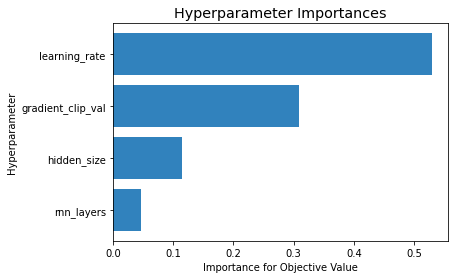

In [11]:
optuna.visualization.matplotlib.plot_param_importances(study)
plt.show()

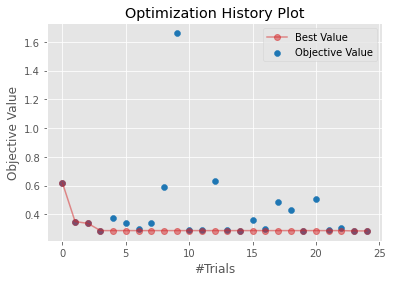



Number of finished trials:  25
Best trial:
  Value:  0.2850015461444855
  Params: 
    learning_rate: 0.0054881845056089385
    hidden_size: 128
    gradient_clip_val: 0.0003878319891082987
    rnn_layers: 5


In [12]:
optuna.visualization.matplotlib.plot_optimization_history(study)
plt.show()
print("\n")

print("Number of finished trials: ", len(study.trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

In [17]:
torch.manual_seed(42) 

# create dataset and dataloader
max_encoder_length = 90    # encoder LSTM에 들어가는 길이
max_prediction_length = 20 # decoder의 길이
log_interval = 10
log_val_interval = 1
limit_train_batches = 50
batch_size = 128
gpus = 1
max_epochs = 150

# training_cutoff = res_data['time_index'].max() - max_prediction_length
# Training_cutoff는 trainingset을 정하기 위한 기준으로 max_prediction_length만 잘라서는 안될거 같음
# 일단 데이터 기간의 30%를 validation으로 정의
training_cutoff = int(res_data['time_index'].max() * .7)

training = TimeSeriesDataSet(
        res_data[lambda x: x.time_index <= training_cutoff],
        time_idx="time_index",
        target="trade_price",
        categorical_encoders={"market": NaNLabelEncoder().fit(res_data.market)},
        group_ids=["market"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_unknown_reals= ["trade_price"],
        time_varying_known_reals=["time_index","dayofweek","month"], 
        static_categoricals=["market"],
        add_relative_time_idx=False,
        add_target_scales=True,
        allow_missing_timesteps=True,
        randomize_length=(0.2, 0.05),
)

validation = TimeSeriesDataSet.from_dataset(
    training,
    res_data,
    min_prediction_idx = training_cutoff + 1,
    # stop_randomization=True
)

train_dataloader = training.to_dataloader(train = True, batch_size = batch_size, num_workers = 0)
val_dataloader = validation.to_dataloader(train = False, batch_size = batch_size, num_workers = 0)

early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=True, mode="min")
lr_logger = LearningRateMonitor()

net = DeepAR.from_dataset(
    training, 
    learning_rate= study.best_params['learning_rate'],
    log_interval=log_interval,
    log_val_interval=log_val_interval,
    hidden_size= study.best_params['hidden_size'],
    rnn_layers= study.best_params['rnn_layers'],
    loss= MultivariateNormalDistributionLoss(rank=30)
)


trainer = pl.Trainer(
    max_epochs =  max_epochs,
    gpus = gpus,
    weights_summary = 'top',
    gradient_clip_val =  study.best_params['gradient_clip_val'],
    callbacks = [lr_logger, early_stop_callback],
    limit_train_batches =  limit_train_batches,
    enable_checkpointing = True,
    auto_lr_find = True,
    logger = TensorBoardLogger('./best_logs')
)


print(f"Number of parameters in network: {net.size()/1e3:.1f}k")

trainer.fit(
    net,
    train_dataloaders = train_dataloader,
    val_dataloaders = val_dataloader,
)

best_model_path = trainer.checkpoint_callback.best_model_path
best_model = net.load_from_checkpoint(best_model_path)

# torch.save(best_model.state_dict(), save_model)

actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions, _ = best_model.predict(val_dataloader, return_x=True, n_samples=100)


print(f'MAE : {(actuals - predictions).abs().mean()}')

SMAPE = (2 * (predictions - actuals).abs() / (predictions.abs() + actuals.abs() + 1e-8)).mean()
print(f'SMAPE : {SMAPE}')



# raw_predictions, x = net.predict(val_dataloader, mode="raw", return_x=True, n_samples=100)

# market = validation.x_to_index(x)["market"]
# for idx in range(1):  # plot 10 examples
#     best_model.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True)
#     plt.suptitle(f"Market: {market.iloc[idx]}")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 1     
3 | rnn                    | LSTM                               | 598 K 
4 | distribution_projector | Linear                             | 4.1 K 
------------------------------------------------------------------------------
602 K     Trainable params
0         Non-trainable params
602 K     Total params
2.411     Total estimated model params size (MB)


Number of parameters in network: 602.7k


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -27.242


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.191 >= min_delta = 0.0001. New best score: -27.433


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.139 >= min_delta = 0.0001. New best score: -27.572


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.372 >= min_delta = 0.0001. New best score: -27.944


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.475 >= min_delta = 0.0001. New best score: -28.419


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.255 >= min_delta = 0.0001. New best score: -28.675


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.646 >= min_delta = 0.0001. New best score: -29.320


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.731 >= min_delta = 0.0001. New best score: -30.052


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.330 >= min_delta = 0.0001. New best score: -30.382


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.848 >= min_delta = 0.0001. New best score: -31.229


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.901 >= min_delta = 0.0001. New best score: -32.131


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.432 >= min_delta = 0.0001. New best score: -32.562


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.038 >= min_delta = 0.0001. New best score: -33.600


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.116 >= min_delta = 0.0001. New best score: -34.716


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.503 >= min_delta = 0.0001. New best score: -35.219


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.281 >= min_delta = 0.0001. New best score: -36.500


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.354 >= min_delta = 0.0001. New best score: -37.855


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.573 >= min_delta = 0.0001. New best score: -38.428


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.458 >= min_delta = 0.0001. New best score: -39.886


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.550 >= min_delta = 0.0001. New best score: -41.436


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.636 >= min_delta = 0.0001. New best score: -42.072


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.688 >= min_delta = 0.0001. New best score: -43.760


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.793 >= min_delta = 0.0001. New best score: -45.553


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.759 >= min_delta = 0.0001. New best score: -46.312


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.890 >= min_delta = 0.0001. New best score: -48.202


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.906 >= min_delta = 0.0001. New best score: -50.108


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.804 >= min_delta = 0.0001. New best score: -50.912


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.937 >= min_delta = 0.0001. New best score: -52.849


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.873 >= min_delta = 0.0001. New best score: -54.722


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.723 >= min_delta = 0.0001. New best score: -55.445


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.594 >= min_delta = 0.0001. New best score: -57.039


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 1.301 >= min_delta = 0.0001. New best score: -58.339


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.440 >= min_delta = 0.0001. New best score: -58.779


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.739 >= min_delta = 0.0001. New best score: -59.518


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.149 >= min_delta = 0.0001. New best score: -59.667


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: -59.667. Signaling Trainer to stop.


MAE : 0.14434842765331268
SMAPE : 0.29447805881500244


In [ ]:
# raw_predictions, x = net.predict(val_dataloader, mode="raw", return_x=True, n_samples=100)

# market = validation.x_to_index(x)["market"]
# for idx in range(1):  # plot 10 examples
#     best_model.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True)
#     plt.suptitle(f"Market: {market.iloc[idx]}")


In [ ]:
save_model

In [38]:

# best_model load
best_model = DeepAR.from_dataset(
    training, 
    learning_rate= study.best_params['learning_rate'],
    log_interval=log_interval,
    log_val_interval=log_val_interval,
    hidden_size= study.best_params['hidden_size'],
    rnn_layers= study.best_params['rnn_layers'],
    loss= MultivariateNormalDistributionLoss(rank=30)
)

best_model.load_state_dict(torch.load(save_model))
best_model.eval()


print(f"Number of parameters in network: {net.size()/1e3:.1f}k")


actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions, _ = best_model.predict(val_dataloader, return_x=True, n_samples=100)

print(f'MAE : {(actuals - predictions).abs().mean()}')

SMAPE = (2 * (predictions - actuals).abs() / (predictions.abs() + actuals.abs() + 1e-8)).mean()
print(f'SMAPE : {SMAPE}')


Number of parameters in network: 602.7k
MAE : 0.14250241219997406
SMAPE : 0.28650718927383423


In [18]:
best_model

DeepAR(
  (loss): MultivariateNormalDistributionLoss()
  (logging_metrics): ModuleList(
    (0): SMAPE()
    (1): MAE()
    (2): RMSE()
    (3): MAPE()
    (4): MASE()
  )
  (embeddings): MultiEmbedding(
    (embeddings): ModuleDict(
      (market): Embedding(1, 1)
    )
  )
  (rnn): LSTM(7, 128, num_layers=5, batch_first=True, dropout=0.1)
  (distribution_projector): Linear(in_features=128, out_features=32, bias=True)
)

In [29]:
actuals.shape # 데이터 전체 길이 - training_cutoff - max_prediction_length ( len(res_data) - int(res_data['time_index'].max() * .7) -20 )

torch.Size([493, 20])

In [39]:
pd.DataFrame(actuals.numpy()) # 하루씩 지나가면서 각 일자별로 20일 이후의 실제값 ( 행 : 기준일자, 열 : 20일씩 일자별 예측 일자 )

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.133831,0.178450,0.191672,0.199902,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492
1,0.178450,0.191672,0.199902,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492,0.221353
2,0.191672,0.199902,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492,0.221353,0.222842
3,0.199902,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492,0.221353,0.222842,0.251736
4,0.217676,0.226519,0.231072,0.237639,0.233611,0.198326,0.191847,0.202704,0.219077,0.211810,0.222667,0.221791,0.223805,0.247708,0.250160,0.203492,0.221353,0.222842,0.251736,0.241317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
488,0.609670,0.599163,0.588656,0.563264,0.515458,0.525440,0.488491,0.447164,0.455219,0.462048,0.474832,0.449265,0.455394,0.416343,0.435781,0.427901,0.430353,0.443486,0.427025,0.425624
489,0.599163,0.588656,0.563264,0.515458,0.525440,0.488491,0.447164,0.455219,0.462048,0.474832,0.449265,0.455394,0.416343,0.435781,0.427901,0.430353,0.443486,0.427025,0.425624,0.420196
490,0.588656,0.563264,0.515458,0.525440,0.488491,0.447164,0.455219,0.462048,0.474832,0.449265,0.455394,0.416343,0.435781,0.427901,0.430353,0.443486,0.427025,0.425624,0.420196,0.388675
491,0.563264,0.515458,0.525440,0.488491,0.447164,0.455219,0.462048,0.474832,0.449265,0.455394,0.416343,0.435781,0.427901,0.430353,0.443486,0.427025,0.425624,0.420196,0.388675,0.373090


In [40]:
pd.DataFrame(predictions.numpy()) # 하루씩 지나가면서 각 일자별로 20일 이후의 예측값 ( 행 : 기준일자, 열 : 20일씩 일자별 예측 일자 )

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.081528,0.085906,0.086471,0.083520,0.091124,0.083761,0.085334,0.089095,0.082498,0.085843,0.087463,0.082001,0.088971,0.083831,0.084385,0.087415,0.082449,0.089388,0.090206,0.095484
1,0.082292,0.085047,0.091969,0.090394,0.095509,0.084880,0.081524,0.085956,0.082849,0.082537,0.088359,0.089315,0.092350,0.082562,0.099939,0.085461,0.084805,0.091659,0.083949,0.086922
2,0.084092,0.086604,0.088725,0.092056,0.093855,0.087814,0.086466,0.097909,0.088208,0.088665,0.089542,0.086888,0.085461,0.094776,0.088951,0.089439,0.084351,0.089282,0.095796,0.080381
3,0.097475,0.097474,0.086594,0.087484,0.094103,0.095753,0.092320,0.077799,0.095013,0.084218,0.097884,0.088689,0.089596,0.078000,0.081894,0.098036,0.090888,0.100825,0.102777,0.103243
4,0.084267,0.094300,0.092518,0.093522,0.094769,0.094817,0.095877,0.103490,0.084384,0.102142,0.097094,0.085758,0.092691,0.084084,0.095284,0.095477,0.100927,0.095113,0.101496,0.091437
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
488,0.629797,0.641557,0.622726,0.637610,0.631217,0.636087,0.631546,0.628411,0.635089,0.632698,0.631575,0.618299,0.636217,0.629157,0.642207,0.630186,0.637192,0.620437,0.631417,0.621440
489,0.609667,0.662995,0.628825,0.626064,0.657209,0.633373,0.649277,0.622615,0.651988,0.632362,0.646443,0.618449,0.629125,0.630697,0.635319,0.642071,0.644005,0.648867,0.624402,0.654914
490,0.636701,0.634302,0.629322,0.631968,0.642355,0.631658,0.630774,0.621932,0.635527,0.652166,0.645478,0.624724,0.642762,0.618956,0.630260,0.608646,0.638109,0.613736,0.628824,0.634101
491,0.639067,0.622997,0.633669,0.630455,0.634991,0.636192,0.629148,0.621828,0.650898,0.650779,0.631220,0.643530,0.616388,0.619261,0.631422,0.641488,0.641696,0.630580,0.635270,0.622054


In [41]:
max_pred_len = len(res_data) - int(res_data['time_index'].max() * .7) - 20 # 493 번쨰 ( 마지막 일자 ) 이후 20일을 비교하려고 함
max_pred_len

493

In [42]:
predict_max = predictions[max_pred_len-1] # 493 번째
predict_max = predict_max.numpy().reshape(-1,1) # inverse_transform 을 위해 데이터 변환
predict_max = scaler_t.inverse_transform(predict_max) # inverse_transform 
predict_max

array([[3795428.8],
       [3774746.5],
       [3747317. ],
       [3836163. ],
       [3780188.5],
       [3696012.5],
       [3709422. ],
       [3754580.5],
       [3790759.5],
       [3767721. ],
       [3772143.5],
       [3690856.2],
       [3592302. ],
       [3667364.2],
       [3737090.8],
       [3675609.5],
       [3785620.5],
       [3718956. ],
       [3667456. ],
       [3713187.5]], dtype=float32)

In [43]:
actual_max = actuals[max_pred_len-1] # 493 번째
actual_max = actual_max.numpy().reshape(-1,1) # inverse_transform 을 위해 데이터 변환
actual_max = scaler_t.inverse_transform(actual_max) # inverse_transform
actual_max

array([[3038000. ],
       [3095000. ],
       [2884000. ],
       [2648000. ],
       [2694000. ],
       [2733000. ],
       [2806000. ],
       [2660000. ],
       [2695000. ],
       [2472000. ],
       [2583000. ],
       [2538000. ],
       [2552000. ],
       [2627000. ],
       [2533000. ],
       [2525000. ],
       [2494000.2],
       [2314000. ],
       [2225000. ],
       [2286000. ]], dtype=float32)

In [44]:
# pred & real 데이터 

predict_max = predictions[max_pred_len-1] # 493 번째
predict_max = predict_max.numpy().reshape(-1) 
pred_data = np.append(res_data.loc[:len(res_data)-max_prediction_length-1,'trade_price'].values, predict_max) # real과 pred 결합
pred_data = scaler_t.inverse_transform(np.expand_dims(pred_data,1)) # inverse_transform 

real_data = scaler_t.inverse_transform(np.expand_dims(res_data.loc[:,'trade_price'],1))

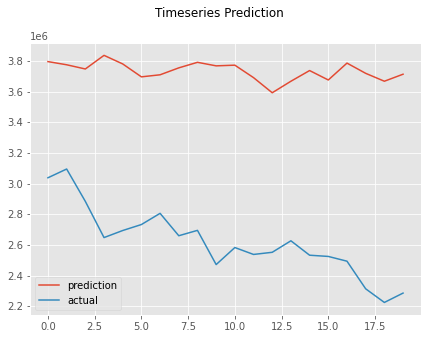

In [45]:
plot_length = len(res_data)-max_prediction_length

plt.figure(figsize=(7, 5))
plt.plot(pred_data[plot_length:], label='prediction')
plt.plot(real_data[plot_length:], label='actual')
plt.suptitle('Timeseries Prediction')
plt.legend()
plt.show()

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=best_logs/

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LR finder stopped early after 432 steps due to diverging loss.
Restoring states from the checkpoint path at /content/.lr_find_610485d9-513c-4c6f-9754-fd39965eaab6.ckpt
Failed to compute suggesting for `lr`. There might not be enough points.
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/pytorch_lightning/tuner/lr_finder.py", line 177, in suggestion
    min_grad = np.gradient(loss).argmin()
  File "<__array_function__ internals>", line 6, in gradient
  File "/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py", line 1065, in gradient
    "Shape of array too small to calculate a numerical gradient, "
ValueError: Shape of array too small to calculate a numerical gradient, at least (edge_order + 1) elements are required.


suggested learning rate: 0.9518433849268452


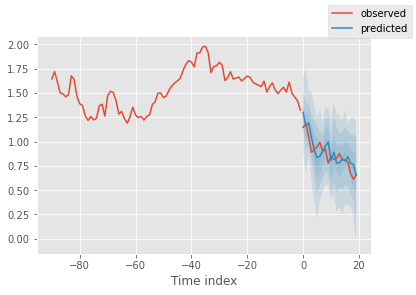

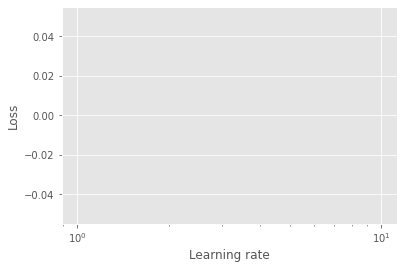

In [ ]:
# find optimal learning rate
res = trainer.tuner.lr_find(net, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader, min_lr=1e-5)
# print(f"suggested learning rate: {study.best_params['learning_rate']}")
print(f"suggested learning rate: {study.best_params['learning_rate']}")
fig = res.plot(show=True, suggest=True)
fig.show()
net.hparams.learning_rate = study.best_params['learning_rate']

In [ ]:
# find optimal learning rate
res = trainer.tuner.lr_find(net, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader, min_lr=1e-5)
print(f"suggested learning rate: {study.best_params['learning_rate']}")
fig = res.plot(show=True, suggest=True)
fig.show()
net.hparams.learning_rate = study.best_params['learning_rate']

In [ ]:
def plot_prediction(
    self,
    x: Dict[str, torch.Tensor],
    out: Dict[str, torch.Tensor],
    idx: int,
    plot_attention: bool = True,
    add_loss_to_title: bool = False,
    show_future_observed: bool = True,
    ax=None,
) -> plt.Figure:
    """
    Plot actuals vs prediction and attention

    Args:
        x (Dict[str, torch.Tensor]): network input
        out (Dict[str, torch.Tensor]): network output
        idx (int): sample index
        plot_attention: if to plot attention on secondary axis
        add_loss_to_title: if to add loss to title. Default to False.
        show_future_observed: if to show actuals for future. Defaults to True.
        ax: matplotlib axes to plot on

    Returns:
        plt.Figure: matplotlib figure
    """
    # plot prediction as normal
    fig = best_model.plot_prediction(
        x, out, idx=idx, add_loss_to_title=add_loss_to_title, show_future_observed=show_future_observed, ax=ax
    )

    # add attention on secondary axis
    if plot_attention:
        interpretation = self.interpret_output(out)
        ax = fig.axes[0]
        ax2 = ax.twinx()
        ax2.set_ylabel("Attention")
        encoder_length = x["encoder_lengths"][idx]
        ax2.plot(
            torch.arange(-encoder_length, 0),
            interpretation["attention"][idx, :encoder_length].detach().cpu(),
            alpha=0.2,
            color="k",
        )
    fig.tight_layout()
    return fig

raw_predictions, x = best_model.predict(val_dataloader, mode = 'raw', return_x=True)

best_model.plot_prediction( x=x,
    out=raw_predictions,
    idx=0)

In [ ]:
cov_matrix = net.loss.map_x_to_distribution(
    net.predict(val_dataloader, mode=("raw", "prediction"), n_samples=None)
).covariance_matrix.mean(0)

# normalize the covariance matrix diagnoal to 1.0
correlation_matrix = cov_matrix / torch.sqrt(torch.diag(cov_matrix) * torch.diag(cov_matrix).T)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(correlation_matrix, cmap="bwr");

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=best_logs/